##  EE444/588 Project 1
Abu Bucker Siddik

In [1]:
import numpy as np
import imageio.v2 as imageio
import matplotlib.pyplot as plt
import os
import glob
import skimage.color
import skimage.measure
import skimage.segmentation
import skimage.filters
import time
from compute_GCE_LCE import compute_GCE_LCE
%matplotlib inline 
plt.rcParams.update({'font.size': 12})

## (a) Generate GT image masks
In this section, we generate ground truth image masks from the segmentation files for 200 training images and 100 testing images of the Berkeley Segmentation Dataset 300.

## (a-i) make_mask Function:
We read the description of the segmentation file format carefully and write a function <b>make_mask(seg_filename,mask_filename)</b> that creates image masks of the ground truth where <b>seg_filename</b> is the filename of the ground truth annotation.

In [2]:
def make_mask(seg_filename,mask_filename):
    filename =seg_filename
    original_array = []
    with open(filename) as f:
        for line in f:
            original_array.append(line.strip())  # Reading the all lines of .seg file

               
    row=int(original_array[5][7:10])  # Reading the row size of the mask image
    col=int(original_array[4][6:9])   # Reading the column size of the mask image
    I=np.zeros((row, col))
    
    segment_array=original_array[11:len(original_array)]  # removing header and line containing text "data"

    
    for i in range(len(segment_array)):
        x1=np.fromstring(segment_array[i], dtype=int, sep=' ') # converting each line string to integers 
        for k in range(x1[2],x1[3]+1):
            I[x1[1],k] = x1[0]         # assigning segmentation number to corresponding pixel
            
                
    img = I.astype(np.uint8)           # converting to uint8 to maintain the segment number
    return img

## a-ii) Loop Over Dataset:
We loop over the 200 training images and 100 test images and create masks for each.

## Test/Gray/Mask Generation
The following code generates ground truth (GT) mask images of 100 test images for human segmenting the grayscale version of the image.

In [3]:
image_directory = 'BSDS300/images/test/'
seg_directory = 'BSDS300/ground_truth/gray/test/'

image_filenames = sorted(glob.glob(image_directory+'*.jpg'))  
seg_filenames = sorted(glob.glob(seg_directory+'*.seg'))

for f,image_filename in enumerate(image_filenames):
    seg_filename = seg_filenames[f]
    mask_filename = os.path.basename(image_filename)[:-4]
    mask=make_mask(seg_filename,mask_filename)
    image = imageio.imwrite('BSDS300/masks/gray/test/' + mask_filename + '.png', mask)

## Test/Color/Mask Generation
The following code generates ground truth (GT) mask images of 100 test images for human segmenting the 
color version of the image.

In [4]:
image_directory = 'BSDS300/images/test/'
seg_directory = 'BSDS300/ground_truth/color/test/'

image_filenames = sorted(glob.glob(image_directory+'*.jpg'))  
seg_filenames = sorted(glob.glob(seg_directory+'*.seg'))

for f,image_filename in enumerate(image_filenames):
    seg_filename = seg_filenames[f]
    mask_filename = os.path.basename(image_filename)[:-4]
    mask=make_mask(seg_filename,mask_filename)
    image = imageio.imwrite('BSDS300/masks/color/test/' + mask_filename + '.png', mask)

## Train/Gray/Mask Generation
The following code generates ground truth (GT) mask images of 200 train images for human segmenting 
the grayscale version of the image.

In [5]:
image_directory = 'BSDS300/images/train/'
seg_directory = 'BSDS300/ground_truth/gray/train/'

image_filenames = sorted(glob.glob(image_directory+'*.jpg'))  
seg_filenames = sorted(glob.glob(seg_directory+'*.seg'))

for f,image_filename in enumerate(image_filenames):
    seg_filename = seg_filenames[f]
    mask_filename = os.path.basename(image_filename)[:-4]
    mask=make_mask(seg_filename,mask_filename)
    image = imageio.imwrite('BSDS300/masks/gray/train/' + mask_filename + '.png', mask)

## Train/Color/Mask Generation
The following code generates ground truth (GT) mask images of 200 train images for human segmenting 
the color version of the image.

In [6]:
image_directory = 'BSDS300/images/train/'
seg_directory = 'BSDS300/ground_truth/color/train/'

image_filenames = sorted(glob.glob(image_directory+'*.jpg'))  
seg_filenames = sorted(glob.glob(seg_directory+'*.seg'))

for f,image_filename in enumerate(image_filenames):
    seg_filename = seg_filenames[f]
    mask_filename = os.path.basename(image_filename)[:-4]
    mask=make_mask(seg_filename,mask_filename)
    image = imageio.imwrite('BSDS300/masks/color/train/' + mask_filename + '.png', mask)

## (a-iii) Display Example Mask:
Visualizations of the original image 100075.jpg and the segmentation mask for the color and grayscale human segmentations are shown below:

In [7]:
# Reading the original image and the mask images
or_image = imageio.imread('BSDS300/images/train/100075.jpg')
col_seg_mask = imageio.imread('BSDS300/masks/color/train/100075.png')
gray_seg_mask = imageio.imread('BSDS300/masks/gray/train/100075.png')

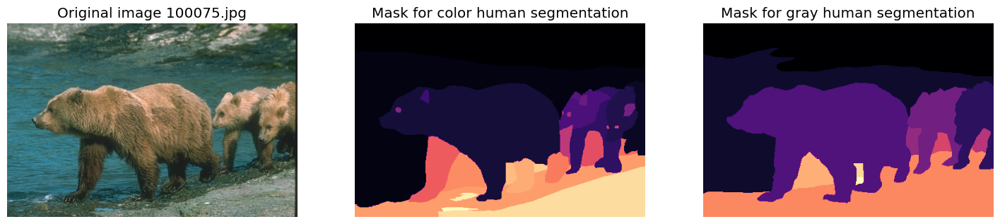

In [11]:
# Displaying the images
plt.figure(figsize=(18, 15))  
plt.subplot(1, 3, 1) # (rows, columns, panel number)
plt.imshow(or_image)
plt.axis('off')
plt.title('Original image 100075.jpg')


plt.subplot(1, 3, 2) # (rows, columns, panel number)
plt.imshow(col_seg_mask, cmap = 'magma')
plt.axis('off')
plt.title('Mask for color human segmentation')

plt.subplot(1, 3, 3) # (rows, columns, panel number)
plt.imshow(gray_seg_mask, cmap = 'magma')
plt.axis('off')
plt.title('Mask for gray human segmentation')
plt.show()

## (b) Create GCE/LCE function
In this section, we write GCE/LCE function and use it to compute global consistency
error (GCE) and local consistency error (LCE) for our lebeled image and ground truth mask image.

## (b-i) compute_GCE_LCE_loop Function:
We carefully read the definition of the global consistency error (GCE) and local consistency error (LCE) in martin2001_BSDS.pdf, and write a function <b>compute_GCE_LCE_loopy(Seg,GT)</b> for the given segmentation <b>Seg</b> and ground truth <b>GT</b>. 


In [12]:
def compute_GCE_LCE_loopy(Seg,GT):
    
    row=Seg.shape[0]
    col=Seg.shape[1]
    E_R1=[]
    E_R2=[]
    
    for i in range(row):
        for j in range(col):
            
            # Finding pixel value at a specific location of two segmentations
            pixel_value_R1=Seg[i,j]
            pixel_value_R2=GT[i,j]
            
            R1=np.zeros((row, col))
            R2=np.zeros((row, col))
            
            #selecting region corresponds to pixel value
            R1=np.where(Seg==pixel_value_R1, 1, 0)
            R2=np.where(GT==pixel_value_R2, 1, 0)
            
            R1_not=(np.logical_not(R1)).astype(int)
            R2_not=(np.logical_not(R2)).astype(int)
            
            R1_diff_R2_pi=(R1 & R2_not)
            R2_diff_R1_pi=(R2 & R1_not)
            
            R1_diff_cardinality = (R1_diff_R2_pi == 1).sum()
            R2_diff_cardinality = (R2_diff_R1_pi == 1).sum()
            
            R1_carninality=np.sum(R1)
            R2_carninality=np.sum(R2)
            
            E_R1_R2= (R1_diff_cardinality/R1_carninality)
            E_R2_R1= (R2_diff_cardinality/R2_carninality)
            
            E_R1.append(E_R1_R2)
            E_R2.append(E_R2_R1)
    
    E1_GCE=sum(E_R1)
    E2_GCE=sum(E_R2)
    
    L1=np.minimum(E_R1, E_R2)
    L2=sum(L1)
    LCE=L2/Seg.size
    
    G1=min(E1_GCE, E2_GCE)
    GCE=G1/Seg.size
    
    return [GCE, LCE]

## (b-ii) Threshold Example Image:
We read image <b>100075.jpg</b> to variable <b>I</b> and convert image <b>I</b> to grayscale image <b>I_gray</b>. Then we threshold the image <b>I_gray</b> at a value of 127/255, and set the lighter pixels to a value of 1.

In [13]:
# read the 100075.jpg image
I = imageio.imread('BSDS300/images/train/100075.jpg')

# Converting to grayscale image
I_gray=skimage.color.rgb2gray(I)

I_G=np.zeros((I_gray.shape[0], I_gray.shape[1]))

# Generating thresholded image
I_G=np.where(I_gray >= 127/255, 1, 0)




The original image, the grayscale image, and the final thresholded image are displayed below:

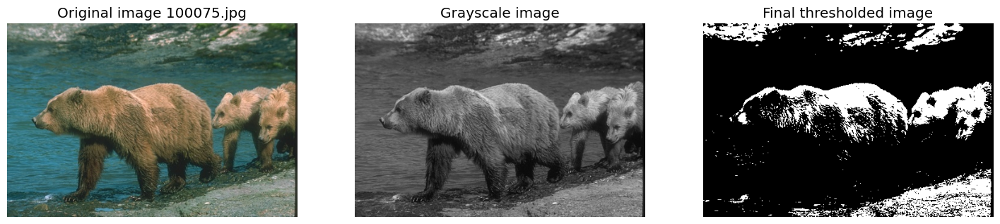

In [14]:
# Displaying the images
plt.figure(figsize=(18, 15))  
plt.subplot(1, 3, 1) # (rows, columns, panel number)
plt.imshow(I)
plt.axis('off')
plt.title('Original image 100075.jpg')


plt.subplot(1, 3, 2) # (rows, columns, panel number)
plt.imshow(I_gray, cmap = 'gray')
plt.axis('off')
plt.title('Grayscale image')

plt.subplot(1, 3, 3) # (rows, columns, panel number)
plt.imshow(I_G, cmap = 'gray')
plt.axis('off')
plt.title('Final thresholded image')
plt.show()

## (b-iii) Determine Connected Components for Thresholded Image:
We assign a different integer number to each of the connected components in final thresholded image <b>I_G</b>, and call this labeled image <b>Seg</b>.

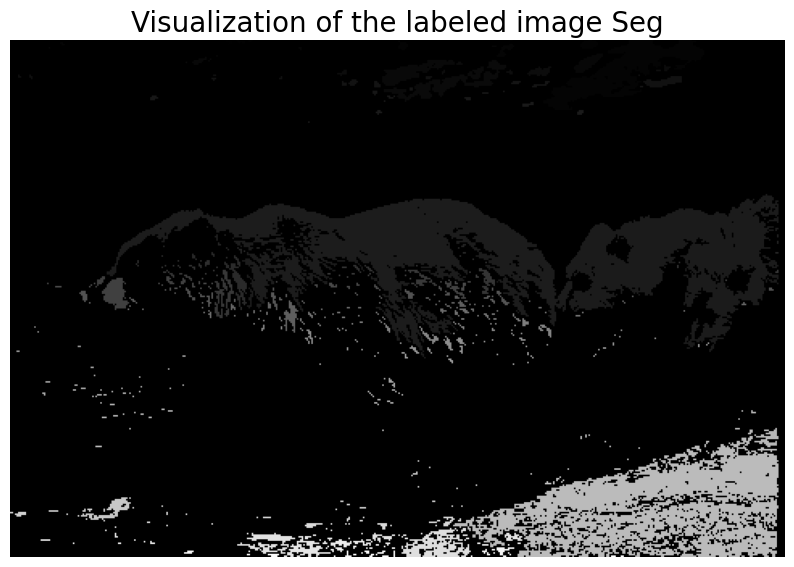

In [18]:
Seg=skimage.measure.label(I_G)

plt.figure(figsize=(10, 8))  
plt.imshow(Seg, cmap = 'gray')
plt.axis('off')
plt.title('Visualization of the labeled image Seg', fontsize = 20)
plt.show()

## (b-iv) Compute GCE and LCE for Example Image:
We use the function <b>compute_GCE_LCE_loopy</b> to compute the GCE and LCE for the labeled image <b>Seg</b> and the ground truth (GT) mask <b>GT</b> from <b>masks/gray/</b>. We print out values for GCE and LCE and the time it took for code to compute the GCE and LCE metrics.

In [19]:
# read GT image
GT = imageio.imread('BSDS300/masks/gray/train/100075.png')

begin_time1=time.time()

[GCE,LCE]=compute_GCE_LCE_loopy(Seg,GT)
total_time = time.time() - begin_time1

print("The GCE is: ", GCE)
print("The LCE is: ", LCE)
print("The time it took: ", total_time, "seconds")

The GCE is:  0.2864754966715982
The LCE is:  0.15609392180261722
The time it took:  154.09333491325378 seconds


## (b-v) Verify GCE and LCE for compute_GCE_LCE Function: 
We include <b>compute_GCE_LCE.py</b> in the working directory and import with <b>from compute_GCE_LCE
import compute_GCE_LCE</b>. We call the function <b>compute_GCE_LCE(Seg,GT)</b> (which avoids looping over all pixels and speed up the computation significantly) to compute the GCE and LCE for the labeled image <b>Seg</b> and the GT mask <b>GT</b> from <b>masks/gray/</b>. We print out values for GCE and LCE and the time it took for code to compute the GCE and LCE metrics.

In [20]:
begin_time2=time.time()

[GCE,LCE]=compute_GCE_LCE(Seg,GT)
total_time2 = time.time() - begin_time2

print("The GCE using compute_GCE_LCE function is: ", GCE)
print("The LCE using compute_GCE_LCE function is: ", LCE)
print("The time it took: ", total_time2, "seconds")



The GCE using compute_GCE_LCE function is:  0.2864754966712151
The LCE using compute_GCE_LCE function is:  0.15609392180257214
The time it took:  1.8363521099090576 seconds


The values for GCE and LCE are same in part (b-iv) and (b-v).

## (c) Evaluate Otsu Threshold Segmentation
In this section, we perform Otsu threshold segmentation to one training image and 100 testing images and then compute GCE and LCE for each image using two different ground truths (GTs)—one specified by a human segmenting the color version of the image and one specified by a human segmenting the grayscale version of the image.

## (c-i) Otsu Thresholded Image:
We compute the otsu threshold value for the the grayscale image <b>I_gray</b> as defined in part (b-ii) for the <b>100075.jpg</b> image and define all pixels greater than or equal to the Otsu threshold as a value of 1 and everything less than the Otsu threshold a value of 0. 

In [21]:
# read the 100075.jpg image
I = imageio.imread('BSDS300/images/train/100075.jpg')

# Converting to grayscale image
I_gray=skimage.color.rgb2gray(I)

#compute the otsu threshold value 
T_otsu=skimage.filters.threshold_otsu(I_gray)

I_otsu=np.zeros((I_gray.shape[0], I_gray.shape[1]))

# Generating OTSU thresholded image
I_otsu=np.where(I_gray >= T_otsu, 1, 0)

# Generating labeled image
Seg_otsu=skimage.measure.label(I_otsu)

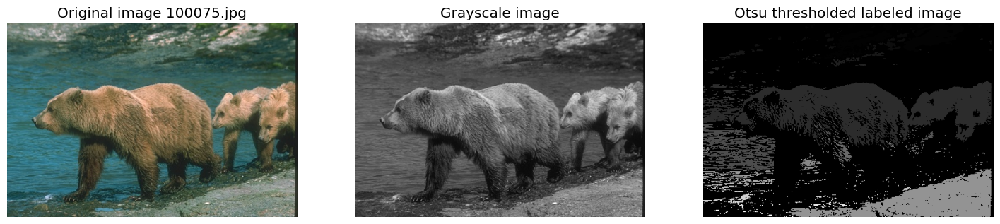

In [23]:
# Displaying the images
plt.figure(figsize=(18, 15))  
plt.subplot(1, 3, 1) # (rows, columns, panel number)
plt.imshow(I)
plt.axis('off')
plt.title('Original image 100075.jpg')


plt.subplot(1, 3, 2) # (rows, columns, panel number)
plt.imshow(I_gray, cmap = 'gray')
plt.axis('off')
plt.title('Grayscale image')

plt.subplot(1, 3, 3) # (rows, columns, panel number)
plt.imshow(Seg_otsu, cmap = 'gray')
plt.axis('off')
plt.title('Otsu thresholded labeled image')
plt.show()


The GCE and LCE using the GT for the image <b>100075.jpg</b> specified by a human segmenting
the color version of the image are computed below:

In [24]:
# read GT image
GT_color = imageio.imread('BSDS300/masks/color/train/100075.png')

[GCE_c,LCE_c]=compute_GCE_LCE(Seg_otsu,GT_color)

print("The GCE for GT with color version is: ", GCE_c)
print("The LCE for GT with color version is: ", LCE_c)

The GCE for GT with color version is:  0.36369024009173184
The LCE for GT with color version is:  0.22937947622043542



The GCE and LCE using the GT for the image <b>100075.jpg</b> specified by a human segmenting
the grayscale version of the image are computed below:

In [25]:
# read GT image
GT_gray = imageio.imread('BSDS300/masks/gray/train/100075.png')

[GCE_g,LCE_g]=compute_GCE_LCE(Seg_otsu,GT_gray)

print("The GCE for GT with grayscale version is: ", GCE_g)
print("The LCE for GT with grayscale version is: ", LCE_g)

The GCE for GT with grayscale version is:  0.4681806361064441
The LCE for GT with grayscale version is:  0.28612081611404605


## (c-ii) Otsu Threshold Performance: 
We loop over all 100 test images in the BSDS, apply the Otsu method to a grayscale version of those images, and compute the GCE and LCE for each image, as compared to both the grayscale and color GTs. We display the
performance of Otsu thresholding as the average error plus/minus the standard deviation.

In [27]:
image_directory = 'BSDS300/images/test/'
color_directory='BSDS300/masks/color/test/'
gray_directory='BSDS300/masks/gray/test/'

image_filenames = sorted(glob.glob(image_directory+'*.jpg'))  
color_GT_filenames = sorted(glob.glob(color_directory+'*.png')) 
gray_GT_filenames = sorted(glob.glob(gray_directory+'*.png')) 

GCE_color=[]
LCE_color=[]
GCE_gray=[]
LCE_gray=[]

begin_time_OTSU=time.time()

for f,image_filename in enumerate(image_filenames):
    I_i=imageio.imread(image_filename)
    I_gray_otsu=skimage.color.rgb2gray(I_i)
    T_otsu_test=skimage.filters.threshold_otsu(I_gray_otsu)
    
    I_otsu_test=np.zeros((I_gray_otsu.shape[0], I_gray_otsu.shape[1]))
    # Generating OTSU thresholded image
    I_otsu_test=np.where(I_gray_otsu >= T_otsu_test, 1, 0)
    Seg_otsu_test=skimage.measure.label(I_otsu_test)
    
    # GCE and LCE for color GT
    I_color=imageio.imread(color_GT_filenames[f])
    [GCE_cl,LCE_cl]=compute_GCE_LCE(Seg_otsu_test,I_color)
    GCE_color.append(GCE_cl)
    LCE_color.append(LCE_cl)
    
    # GCE and LCE for grayscale GT
    I_gray=imageio.imread(gray_GT_filenames[f])
    [GCE_gr,LCE_gr]=compute_GCE_LCE(Seg_otsu_test,I_gray)
    GCE_gray.append(GCE_gr)
    LCE_gray.append(LCE_gr)
    
# computing time required   
total_time_OTSU= time.time() - begin_time_OTSU

# Computing mean and standatd deviation for GCE and LCE using color GTs
GCE_color_mean=sum(GCE_color) / len(GCE_color)
LCE_color_mean=sum(LCE_color) / len(LCE_color)
GCE_color_std=np.std(GCE_color)
LCE_color_std=np.std(LCE_color)


## Computing mean and standatd deviation for GCE and LCE using grayscale GTs
GCE_gray_mean=sum(GCE_gray) / len(GCE_gray)
LCE_gray_mean=sum(LCE_gray) / len(LCE_gray)
GCE_gray_std=np.std(GCE_gray)
LCE_gray_std=np.std(LCE_gray)

print("Total time taken: ", total_time_OTSU, "s")
print("GCE for color GT: ", GCE_color_mean, "\u00B1", GCE_color_std)
print("LCE for color GT: ", LCE_color_mean, "\u00B1", LCE_color_std)
print("GCE for gray GT: ", GCE_gray_mean, "\u00B1", GCE_gray_std)
print("LCE for gray GT: ", LCE_gray_mean, "\u00B1", LCE_gray_std)

Total time taken:  704.0682311058044 s
GCE for color GT:  0.2664987306980804 ± 0.12621678879040288
LCE for color GT:  0.19089236319636044 ± 0.09950065634359095
GCE for gray GT:  0.2788771059287555 ± 0.12388910463272818
LCE for gray GT:  0.1992606213917 ± 0.10048411528263243



It is obvious from above results that mean of GCE using graysacale GTs is more compared to mean of GCE using color GTs. The same pattern follows for LCE result. The mean of LCE using graysacale GTs is more compare to the mean of LCE using color GTS. The statement that LCE is less than or equal to GCE is proven in the displayed results for both graysacale GTs or color GTs.

## (c-iii) Best and Worst Otsu Performance:
We know that GCE is more strict compared to LCE. As the mean of GCE using grayscale GTs are largest compared to all other error measures displayed in (c-ii), we will use GCE using grayscale GTs to find the best and worse Otsu performance images.

## Best Otsu Performance:
We find the best Otsu performance image using GCE for grayscale GTs and display the original best performance image, grayscale version of this image, and the best Otsu thresholded labeled image.

In [28]:
min_GCE_gray = min(GCE_gray)
min_GCE_gray_index=GCE_gray.index(min_GCE_gray)

I_otsu_best=imageio.imread(image_filenames[min_GCE_gray_index])
I_otsu_best_gray=skimage.color.rgb2gray(I_otsu_best)
T_otsu_best=skimage.filters.threshold_otsu(I_otsu_best_gray)
I_otsu_B=np.zeros((I_otsu_best_gray.shape[0], I_otsu_best_gray.shape[1]))

# Generating Otsu thresholded image
I_otsu_B=np.where(I_otsu_best_gray >= T_otsu_best, 1, 0)

# Generating labeled image
Seg_otsu_Best=skimage.measure.label(I_otsu_B)

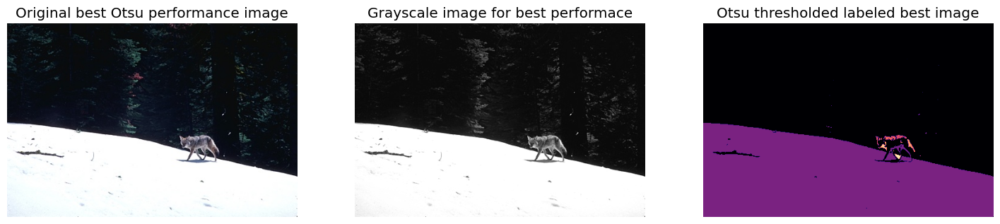

In [29]:
# Displaying the images
plt.figure(figsize=(18, 15))  
plt.subplot(1, 3, 1) # (rows, columns, panel number)
plt.imshow(I_otsu_best)
plt.axis('off')
plt.title('Original best Otsu performance image')


plt.subplot(1, 3, 2) # (rows, columns, panel number)
plt.imshow(I_otsu_best_gray, cmap = 'gray')
plt.axis('off')
plt.title('Grayscale image for best performace')

plt.subplot(1, 3, 3) # (rows, columns, panel number)
plt.imshow(Seg_otsu_Best, cmap = 'magma')
plt.axis('off')
plt.title('Otsu thresholded labeled best image')
plt.show()

## 
The GCEs and LCEs for best Otsu Performance image are displayed below:
    

In [33]:
print("The GCE for Best Otsu thresholded labeled image using grayscale GT: ", GCE_gray[min_GCE_gray_index])
print("The LCE for Best Otsu thresholded labeled image using grayscale GT: ", LCE_gray[min_GCE_gray_index])

print("The GCE for Best Otsu thresholded labeled image using color GT: ", GCE_color[min_GCE_gray_index])
print("The LCE for Best Otsu thresholded labeled image using color GT: ", LCE_color[min_GCE_gray_index])

The GCE for Best Otsu thresholded labeled image using grayscale GT:  0.01295187201609576
The LCE for Best Otsu thresholded labeled image using grayscale GT:  0.009708022882267025
The GCE for Best Otsu thresholded labeled image using color GT:  0.016924452977224898
The LCE for Best Otsu thresholded labeled image using color GT:  0.010900331336442822


Otsu threshold segmentation performs best for the image shown above. If we consider the histogram of grayscale version this image, we can easily find that there will be distinct valleys in the histogram. As a result, it is easier for the Otsu threshold to find the best Otsu threshold and eventually results in best segmentation performance.

## Worse Otsu Performance:
We find the worse Otsu performance image using GCE for grayscale GTs and display the original worse performance image, grayscale version of the image, and the worse Otsu thresholded labeled image.

In [36]:
max_GCE_gray = max(GCE_gray)
max_GCE_gray_index=GCE_gray.index(max_GCE_gray)

I_otsu_worse=imageio.imread(image_filenames[max_GCE_gray_index])
I_otsu_worse_gray=skimage.color.rgb2gray(I_otsu_worse)
T_otsu_worse=skimage.filters.threshold_otsu(I_otsu_worse_gray)
I_otsu_W=np.zeros((I_otsu_worse_gray.shape[0], I_otsu_worse_gray.shape[1]))

# Generating OTSU thresholded image
I_otsu_W=np.where(I_otsu_worse_gray >= T_otsu_worse, 1, 0)

# Generating labeled image
Seg_otsu_worse=skimage.measure.label(I_otsu_W)

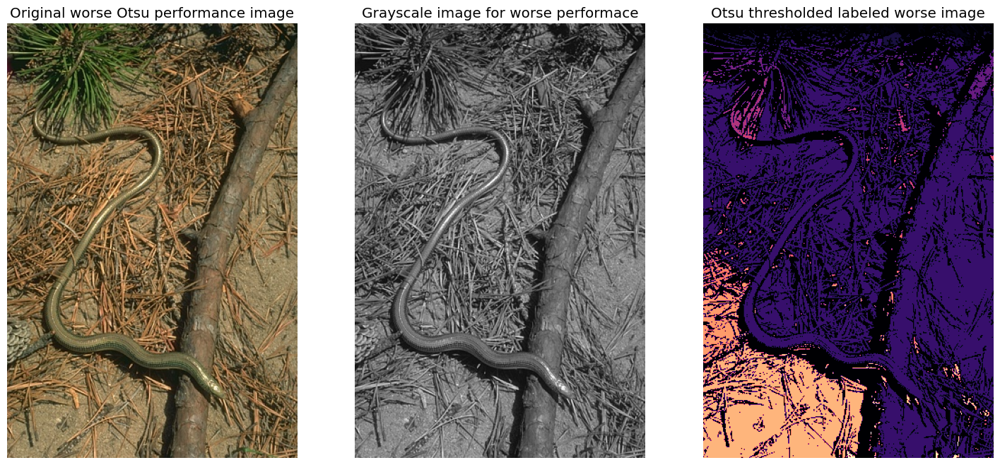

In [37]:
# Displaying the images
plt.figure(figsize=(18, 15))  
plt.subplot(1, 3, 1) # (rows, columns, panel number)
plt.imshow(I_otsu_worse)
plt.axis('off')
plt.title('Original worse Otsu performance image')


plt.subplot(1, 3, 2) # (rows, columns, panel number)
plt.imshow(I_otsu_worse_gray, cmap = 'gray')
plt.axis('off')
plt.title('Grayscale image for worse performace')

plt.subplot(1, 3, 3) # (rows, columns, panel number)
plt.imshow(Seg_otsu_worse, cmap = 'magma')
plt.axis('off')
plt.title('Otsu thresholded labeled worse image')
plt.show()

## 
The GCEs and LCEs for worse Otsu performance image are displayed below:

In [38]:
print("The GCE for worse Otsu thresholded labeled image using grayscale GT: ", GCE_gray[max_GCE_gray_index])
print("The LCE for worse Otsu thresholded labeled image using grayscale GT: ", LCE_gray[max_GCE_gray_index])

print("The GCE for worse Otsu thresholded labeled image using color GT: ", GCE_color[max_GCE_gray_index])
print("The LCE for worse Otsu thresholded labeled image using color GT: ", LCE_color[max_GCE_gray_index])

The GCE for worse Otsu thresholded labeled image using grayscale GT:  0.5578880942746144
The LCE for worse Otsu thresholded labeled image using grayscale GT:  0.44243513410971624
The GCE for worse Otsu thresholded labeled image using color GT:  0.47968467760907096
The LCE for worse Otsu thresholded labeled image using color GT:  0.43654897305059304



The Otsu threshold segmentation performs worse for the image shown above. This is because the intensity values of the object and background for the grayscale version of the image is very close. As a result, Otsu threshold segmentation finds it very hard to perform a good segmentation and eventually results in worse segmentation performance 

## (d) Evaluate SLIC Superpixel Segmentation
In this section, we perform SLIC superpixel segmentation to one training image and 100 testing images and then compute GCE and LCE for each image using two different ground truths (GTs)—one specified by a human segmenting the color version of the image and one specified by a human segmenting the grayscale version of the image. We also optimize SLIC segmentation performance by varing the compactness parameter <b>m</b> with the 200 training images.

## (d-i) SLIC Superpixels as Label Image:
We compute the SLIC superpixel segmentation for the <b>100075.jpg</b> image using default compactness parameter <b>m=10</b> (as discussed in section 4.1: Adherence to Boundaries of the the Achanta2012 paper) and 100 superpixels. Then we display the SLIC superpixel segmentation for the <b>100075.jpg</b> image as a label image. 

In [39]:
I = imageio.imread('BSDS300/images/train/100075.jpg')

#SLIC superpixel segmentation 
I_slic = skimage.segmentation.slic(I, n_segments=100, compactness=10)

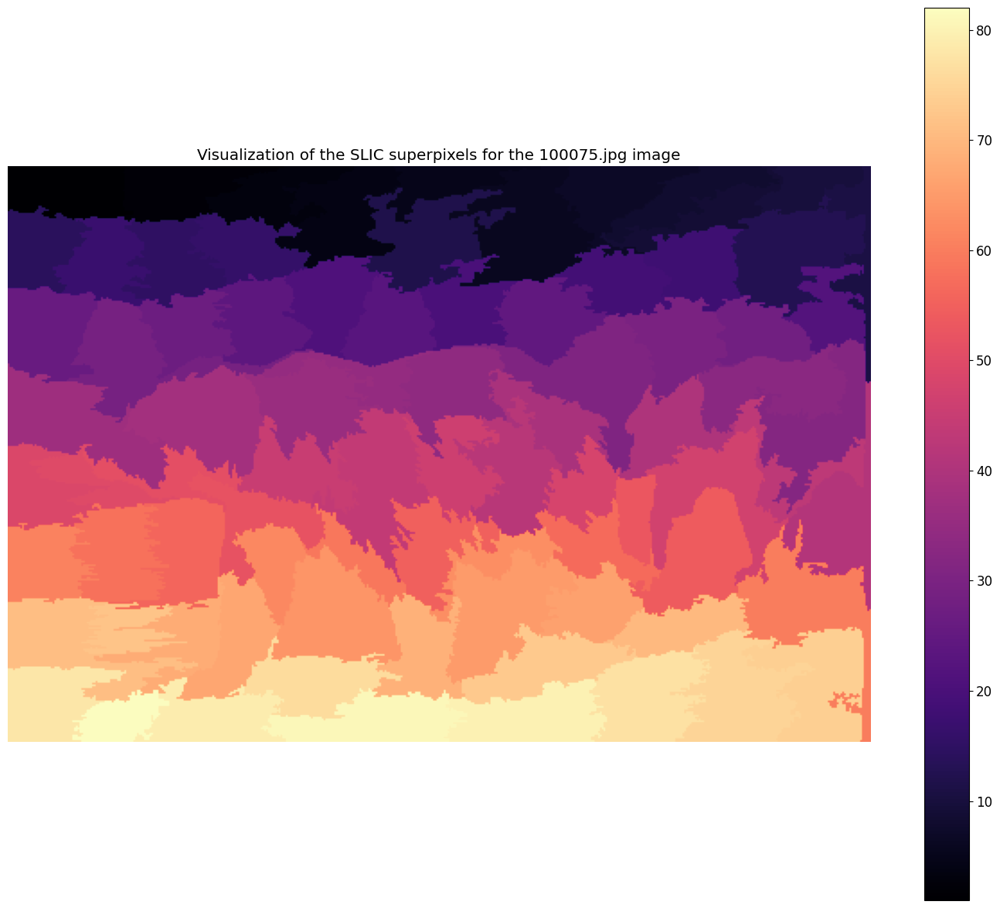

In [42]:
plt.figure(figsize=(18, 15)) 
plt.imshow(I_slic, cmap = 'magma')
plt.axis('off')
plt.colorbar()
plt.title('Visualization of the SLIC superpixels for the 100075.jpg image')
plt.show()

The GCEs and LCEs for the SLIC superpixel segmentation are given below:

In [43]:
# read color GT image
GT_color = imageio.imread('BSDS300/masks/color/train/100075.png')
[GCE_c_s,LCE_c_s]=compute_GCE_LCE(I_slic,GT_color)

# read gray GT image
GT_gray = imageio.imread('BSDS300/masks/gray/train/100075.png')
[GCE_g_s,LCE_g_s]=compute_GCE_LCE(I_slic,GT_gray)

print("The GCE for GT with color version is: ", GCE_c_s)
print("The LCE for GT with color version is: ", LCE_c_s)
print("The GCE for GT with grayscale version is: ", GCE_g_s)
print("The LCE for GT with grayscale version is: ", LCE_g_s)

The GCE for GT with color version is:  0.2145883469396446
The LCE for GT with color version is:  0.1937397749136677
The GCE for GT with grayscale version is:  0.16521404437863974
The LCE for GT with grayscale version is:  0.15326510368498358


## (d-ii) SLIC Superpixels as Average Color:
We create a function with syntax <b>I_avg =Seg_avg_color(I,I_slic)</b> that assigns each SLIC superpixel to have the average color of all pixels within that superpixel. I is the original image, which could be either grayscale or color (the code automatically deals with both cases), I_slic is the label image output by the SLIC superpixel algorithm and I_avg is the output image with the same dimensions as I in which each SLIC
superpixel has been assigned the average color of all pixels within each superpixel.

In [46]:
def Seg_avg_color(I,I_slic):
    
    dim = True
    max_label=I_slic.max()
    min_label=I_slic.min()
    I_avg=np.zeros((I.shape))
    if len(I.shape) > 2:
        total_channels=I.shape[2]
    else:
        total_channels=1
        dim = False
    
  
    for i in range (min_label, max_label+1):
        for j in range(total_channels):
            # j go through each channel of I image
            index_position_with_label_i = np.where(I_slic == i)
            row_positions=index_position_with_label_i[0]
            col_positions=index_position_with_label_i[1]
            if dim == True:
                avg=np.mean(I[row_positions,col_positions,j])
                I_avg[row_positions,col_positions,j]=avg
            else:
                avg=np.mean(I[row_positions,col_positions])
                I_avg[row_positions,col_positions]=avg
                
    return I_avg.astype(np.uint8)

We compute <b>I_avg</b> for the <b>100075.jpg</b> image and display the <b>I_avg</b>.

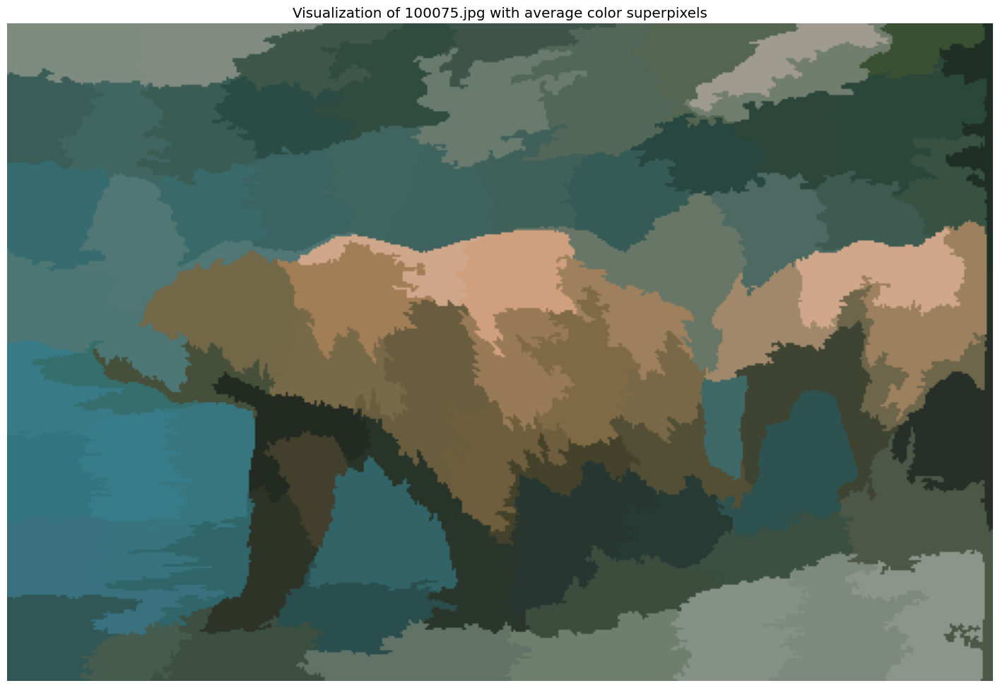

In [49]:
I_avg=Seg_avg_color(I,I_slic)

plt.figure(figsize=(18, 15)) 
plt.imshow(I_avg)
plt.axis('off')
plt.title('Visualization of 100075.jpg with average color superpixels')
plt.show()

## (d-iii) SLIC Superpixel Performance:
We loop over all 100 test images in the BSDS, apply SLIC superpixel segmentation with 100 superpixels and the default compactness parameter, and compute the GCE and LCE for each image, as compared to both the grayscale and color GTs. We display the performance of SLIC Superpixel as the average error plus/minus the standard deviation.

In [50]:
image_directory = 'BSDS300/images/test/'
color_directory='BSDS300/masks/color/test/'
gray_directory='BSDS300/masks/gray/test/'

image_filenames = sorted(glob.glob(image_directory+'*.jpg'))  
color_GT_filenames = sorted(glob.glob(color_directory+'*.png')) 
gray_GT_filenames = sorted(glob.glob(gray_directory+'*.png')) 

GCE_color_sl=[]
LCE_color_sl=[]
GCE_gray_sl=[]
LCE_gray_sl=[]

begin_time_slic=time.time()

for f,image_filename in enumerate(image_filenames):
    I_ii=imageio.imread(image_filename)
    I_slici = skimage.segmentation.slic(I_ii, n_segments=100, compactness=10)
    
    I_color=imageio.imread(color_GT_filenames[f])
    [GCE_cl_sl,LCE_cl_sl]=compute_GCE_LCE(I_slici,I_color)
    GCE_color_sl.append(GCE_cl_sl)
    LCE_color_sl.append(LCE_cl_sl)
    
    I_gray=imageio.imread(gray_GT_filenames[f])
    [GCE_gr_sl,LCE_gr_sl]=compute_GCE_LCE(I_slici,I_gray)
    GCE_gray_sl.append(GCE_gr_sl)
    LCE_gray_sl.append(LCE_gr_sl)
    
    
total_time_slic= time.time() - begin_time_slic
GCE_color_mean_sl=sum(GCE_color_sl) / len(GCE_color_sl)
LCE_color_mean_sl=sum(LCE_color_sl) / len(LCE_color_sl)
GCE_color_std_sl=np.std(GCE_color_sl)
LCE_color_std_sl=np.std(LCE_color_sl)



GCE_gray_mean_sl=sum(GCE_gray_sl) / len(GCE_gray_sl)
LCE_gray_mean_sl=sum(LCE_gray_sl) / len(LCE_gray_sl)
GCE_gray_std_sl=np.std(GCE_gray_sl)
LCE_gray_std_sl=np.std(LCE_gray_sl)

print("Total time taken: ", total_time_slic, "s")
print("GCE for color GT: ", GCE_color_mean_sl, "\u00B1", GCE_color_std_sl)
print("LCE for color GT: ", LCE_color_mean_sl, "\u00B1", LCE_color_std_sl)
print("GCE for grayscale GT: ", GCE_gray_mean_sl, "\u00B1", GCE_gray_std_sl)
print("LCE for grayscale GT: ", LCE_gray_mean_sl, "\u00B1", LCE_gray_std_sl)



Total time taken:  86.56068706512451 s
GCE for color GT:  0.20026131159909966 ± 0.09834876807298437
LCE for color GT:  0.17303376815498597 ± 0.08048716399801366
GCE for grayscale GT:  0.19303835533539254 ± 0.09290832793601153
LCE for grayscale GT:  0.16745966313452582 ± 0.07111696589210596


It is obvious from above results that mean of GCE using color GTs is more compared to mean of GCE using grayscale GTs. The same pattern follows for LCE results. The mean of LCE using color GTs is more compare to the mean of LCE using gray GTS. The statement that LCE is less than or equal to GCE is proven in the displayed results for both graysacale GTs or color GTs.

Comparing these results with the performance of the Otsu segmentation, we find that SLIC segmentation performs better compared to Otsu segmentation. This is because all the GCE and LCE values decrease for SLIC segmentation compared to Otsu segmentation.



## (d-iv) Best and Worst SLIC Performance:

We know that GCE is more strict compared to LCE. As the mean of GCE using color GTs are largest compared to all other error measures displayed in (d-iii), we will use GCE using color GTs to find the best and worse SLIC performance images.

## Best SLIC Performance:
We find the best SLIC performance image using GCE for color GTs and display the original best performance image, and the best SLIC performance image with average color superpixels.

In [58]:
min_GCE_color_sl = min(GCE_color_sl)
min_GCE_color_index_sl=GCE_color_sl.index(min_GCE_color_sl)

I_slic_best=imageio.imread(image_filenames[min_GCE_color_index_sl])

I_slic_best_slic=skimage.segmentation.slic(I_slic_best, n_segments=100, compactness=10)

# Best SLIC performance image with average color superpixels
I_avg_best=Seg_avg_color(I_slic_best,I_slic_best_slic)

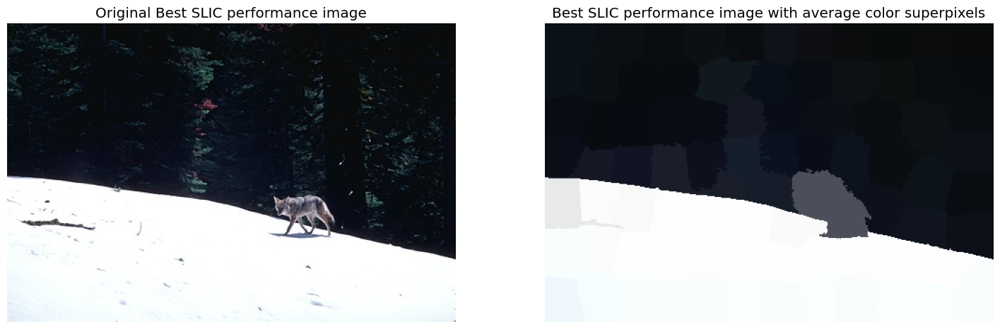

In [59]:
# Displaying the images
plt.figure(figsize=(18, 15))  
plt.subplot(1, 2, 1) # (rows, columns, panel number)
plt.imshow(I_slic_best)
plt.axis('off')
plt.title('Original Best SLIC performance image')


plt.subplot(1, 2, 2) # (rows, columns, panel number)
plt.imshow(I_avg_best)
plt.axis('off')
plt.title('Best SLIC performance image with average color superpixels')
plt.show()

The GCEs and LCEs for best SLIC performance image are displayed below:

In [60]:
print("The GCE for best SLIC performance image using color GT: ", GCE_color_sl[min_GCE_color_index_sl])
print("The LCE for best SLIC performance image using color GT: ", LCE_color_sl[min_GCE_color_index_sl])

print("The GCE for best SLIC performance image using grayscale GT: ", GCE_gray_sl[min_GCE_color_index_sl])
print("The LCE for best SLIC performance image using grayscale GT: ", LCE_gray_sl[min_GCE_color_index_sl])

The GCE for best SLIC performance image using color GT:  0.02399646747920254
The LCE for best SLIC performance image using color GT:  0.01734829029173127
The GCE for best SLIC performance image using grayscale GT:  0.14963543425777154
The LCE for best SLIC performance image using grayscale GT:  0.13994180748327917


SLIC segmentation performs best for the image shown above. This is because the best performance image contains only two main regions (dark and light) with one object. Also, there is a contrast presence between the objcet and the two main regions, which helps the SLIC segmentation to perform well in this image.

## Worse SLIC Performance:
We find the worse SLIC performance image using GCE for color GTs and display the original worse performance image, and the worse SLIC performance image with average color superpixels.

In [62]:
max_GCE_color_sl = max(GCE_color_sl)
max_GCE_color_index_sl=GCE_color_sl.index(max_GCE_color_sl)

I_slic_worse=imageio.imread(image_filenames[max_GCE_color_index_sl])

I_slic_worse_slic=skimage.segmentation.slic(I_slic_worse, n_segments=100, compactness=10)

# Worse SLIC performance image with average color superpixels
I_avg_worse=Seg_avg_color(I_slic_worse,I_slic_worse_slic)

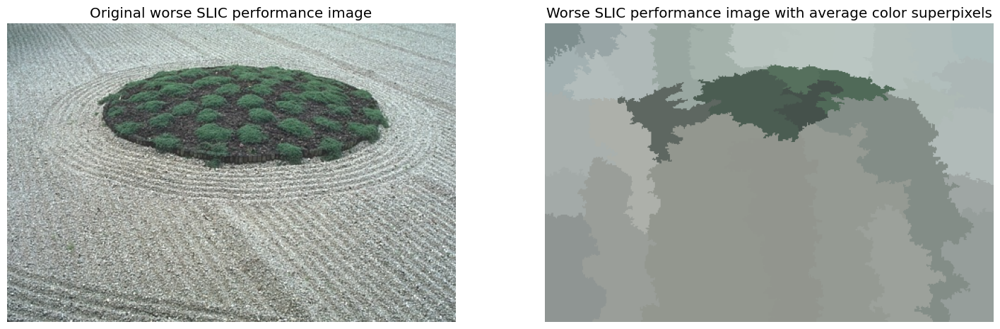

In [63]:
# Displaying the images
plt.figure(figsize=(18, 15))  
plt.subplot(1, 2, 1) # (rows, columns, panel number)
plt.imshow(I_slic_worse)
plt.axis('off')
plt.title('Original worse SLIC performance image')


plt.subplot(1, 2, 2) # (rows, columns, panel number)
plt.imshow(I_avg_worse)
plt.axis('off')
plt.title('Worse SLIC performance image with average color superpixels')
plt.show()

The GCEs and LCEs for worse SLIC performance image are displayed below:

In [64]:
print("The GCE for worse SLIC performance image using color GT: ", GCE_color_sl[max_GCE_color_index_sl])
print("The LCE for worse SLIC performance image using color GT: ", LCE_color_sl[max_GCE_color_index_sl])

print("The GCE for worse SLIC performance image using grayscale GT: ", GCE_gray_sl[max_GCE_color_index_sl])
print("The LCE for worse SLIC performance image using grayscale GT: ", LCE_gray_sl[max_GCE_color_index_sl])

The GCE for worse SLIC performance image using color GT:  0.5103772245796343
The LCE for worse SLIC performance image using color GT:  0.44516515575673915
The GCE for worse SLIC performance image using grayscale GT:  0.5131238342734714
The LCE for worse SLIC performance image using grayscale GT:  0.468359727872205


SLIC segmentation performs worse for the image shown above. This is because the structure of the worse performance image is more complex compared to the stucture of the best performance image. Also, the worse performance image contains more uniform colors and more small detailed background compared to best performance image. Due to that SLIC segmentation finds it very hard to properly defined the superpixels (the nymber of superpixels are very less compared to the number of segments in code which is 100) and performs worse segmentation for this image.

## (d-v) Optimize SLIC Segmentation Performance: 
We loop over a range of compactness values, keyword compactness in code and parameter m in Achanta2012, and compute the average and standard deviation of the GCE and LCE on the 200 training images.



In [65]:
image_directory = 'BSDS300/images/train/'
color_directory='BSDS300/masks/color/train/'
gray_directory='BSDS300/masks/gray/train/'

image_filenames = sorted(glob.glob(image_directory+'*.jpg'))  
color_GT_filenames = sorted(glob.glob(color_directory+'*.png')) 
gray_GT_filenames = sorted(glob.glob(gray_directory+'*.png')) 

GCE_color_mean_sl_m=[]
LCE_color_mean_sl_m=[]
GCE_color_std_sl_m=[]
LCE_color_std_sl_m=[]

GCE_gray_mean_sl_m=[]
LCE_gray_mean_sl_m=[]
GCE_gray_std_sl_m=[]
LCE_gray_std_sl_m=[]

for m in range(1, 25):
    GCE_color_sl=[]
    LCE_color_sl=[]
    GCE_gray_sl=[]
    LCE_gray_sl=[]
    for f,image_filename in enumerate(image_filenames):
        I_ii=imageio.imread(image_filename)
        I_slici = skimage.segmentation.slic(I_ii, n_segments=100, compactness=m)
    
        I_color=imageio.imread(color_GT_filenames[f])
        [GCE_cl_sl,LCE_cl_sl]=compute_GCE_LCE(I_slici,I_color)
        GCE_color_sl.append(GCE_cl_sl)
        LCE_color_sl.append(LCE_cl_sl)
    
        I_gray=imageio.imread(gray_GT_filenames[f])
        [GCE_gr_sl,LCE_gr_sl]=compute_GCE_LCE(I_slici,I_gray)
        GCE_gray_sl.append(GCE_gr_sl)
        LCE_gray_sl.append(LCE_gr_sl)
    
    GCE_color_mean_sl=sum(GCE_color_sl) / len(GCE_color_sl)
    LCE_color_mean_sl=sum(LCE_color_sl) / len(LCE_color_sl)
    GCE_color_std_sl=np.std(GCE_color_sl)
    LCE_color_std_sl=np.std(LCE_color_sl) 
    
    GCE_color_mean_sl_m.append(GCE_color_mean_sl)
    LCE_color_mean_sl_m.append(LCE_color_mean_sl)
    GCE_color_std_sl_m.append(GCE_color_std_sl)
    LCE_color_std_sl_m.append(LCE_color_std_sl)
    
    
    GCE_gray_mean_sl=sum(GCE_gray_sl) / len(GCE_gray_sl)
    LCE_gray_mean_sl=sum(LCE_gray_sl) / len(LCE_gray_sl)
    GCE_gray_std_sl=np.std(GCE_gray_sl)
    LCE_gray_std_sl=np.std(LCE_gray_sl)
    
    GCE_gray_mean_sl_m.append(GCE_gray_mean_sl)
    LCE_gray_mean_sl_m.append(LCE_gray_mean_sl)
    GCE_gray_std_sl_m.append(GCE_gray_std_sl)
    LCE_gray_std_sl_m.append(LCE_gray_std_sl)
    

The error bar plots of the error measures versus compactness m as computed over the 200 training images are shown below:

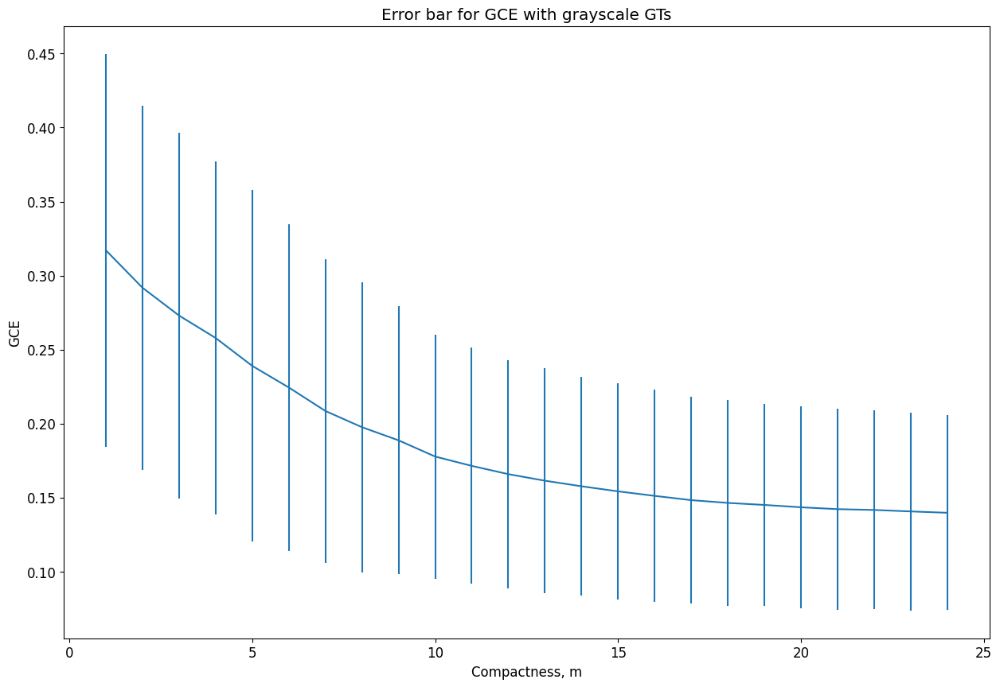

In [71]:
plt.figure(figsize=(15,10))
plt.errorbar(range (1,25),GCE_gray_mean_sl_m,yerr=GCE_gray_std_sl_m)
plt.xlabel('Compactness, m')
plt.ylabel('GCE')
plt.title('Error bar for GCE with grayscale GTs')
plt.show()

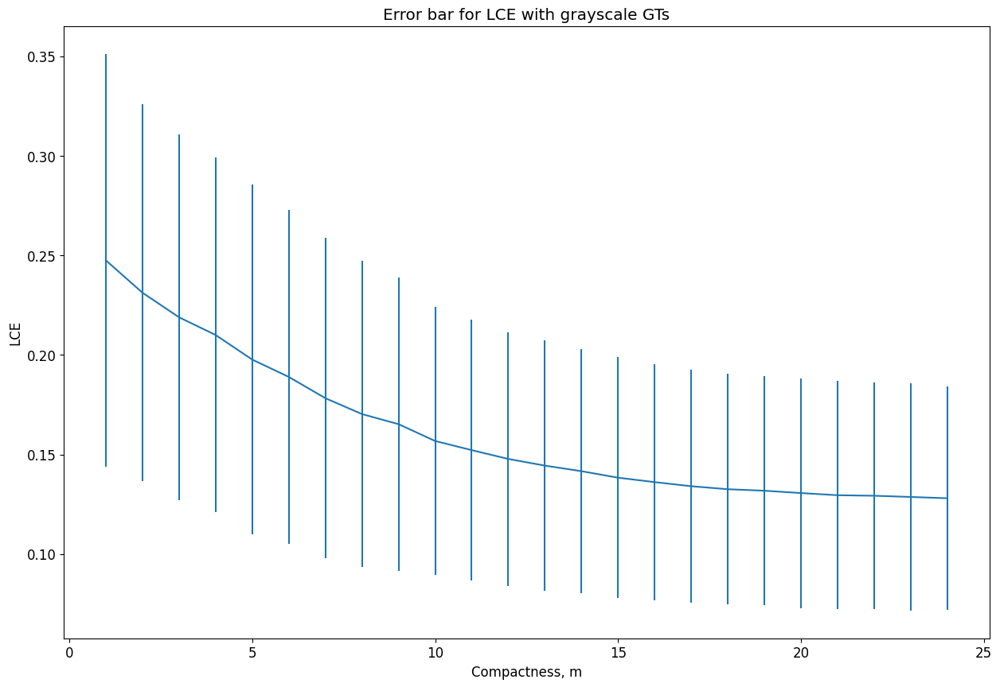

In [72]:
plt.figure(figsize=(15,10))
plt.errorbar(range (1,25),LCE_gray_mean_sl_m,yerr=LCE_gray_std_sl_m)
plt.xlabel('Compactness, m')
plt.ylabel('LCE')
plt.title('Error bar for LCE with grayscale GTs')
plt.show()

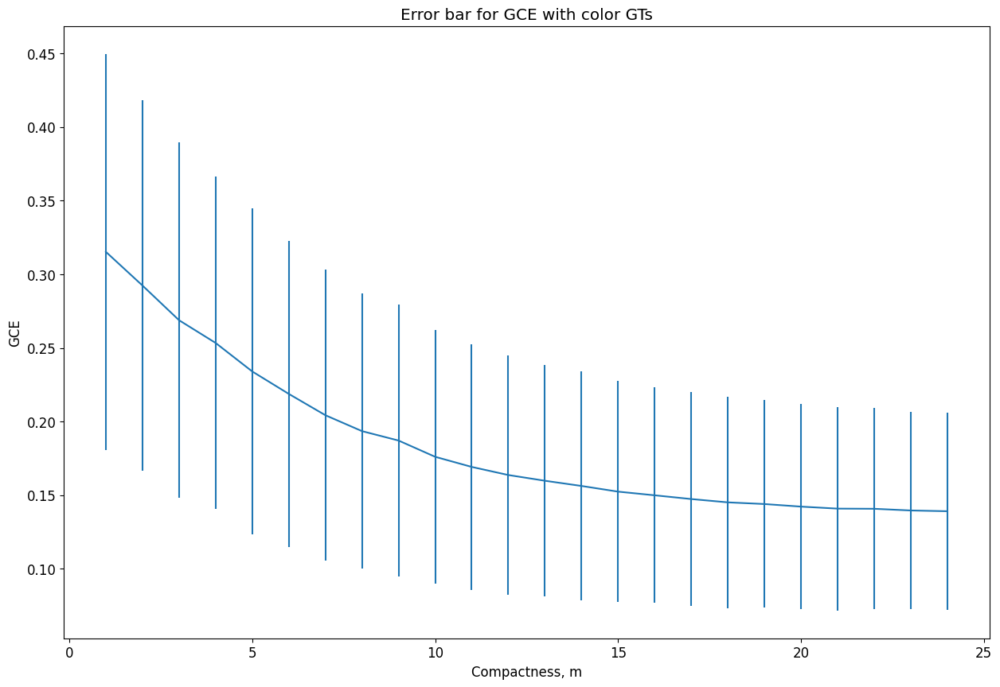

In [73]:
plt.figure(figsize=(15,10))
plt.errorbar(range (1,25),GCE_color_mean_sl_m,yerr=GCE_color_std_sl_m)
plt.xlabel('Compactness, m')
plt.ylabel('GCE')
plt.title('Error bar for GCE with color GTs')
plt.show()

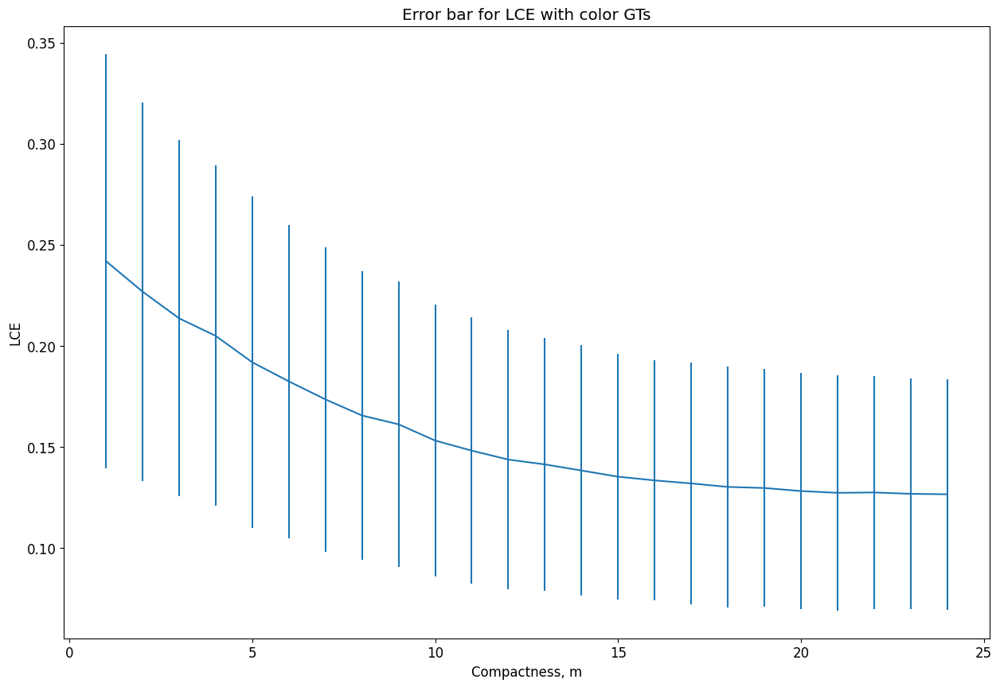

In [74]:
plt.figure(figsize=(15,10))
plt.errorbar(range (1,25),LCE_color_mean_sl_m,yerr=LCE_color_std_sl_m)
plt.xlabel('Compactness, m')
plt.ylabel('LCE')
plt.title('Error bar for LCE with color GTs')
plt.show()

We choose m=20 as best compactness parameter for this dataset. This is because after m=20, the error measures become almost constant as displayed in the error bar plots above. Now, we loop over all 100 test images in the BSDS, apply SLIC superpixel segmentation with 100 superpixels and the best compactness parameter,m=20 and compute the GCE and LCE for each image, as compared to both the grayscale and color GTs. We display the performance of SLIC Superpixel for the best compactness parameter,m=20 as the average error plus/minus the standard deviation.

In [126]:
image_directory = 'BSDS300/images/test/'
color_directory='BSDS300/masks/color/test/'
gray_directory='BSDS300/masks/gray/test/'

image_filenames = sorted(glob.glob(image_directory+'*.jpg'))  
color_GT_filenames = sorted(glob.glob(color_directory+'*.png')) 
gray_GT_filenames = sorted(glob.glob(gray_directory+'*.png')) 

GCE_color_sl=[]
LCE_color_sl=[]
GCE_gray_sl=[]
LCE_gray_sl=[]

begin_time_slic=time.time()

for f,image_filename in enumerate(image_filenames):
    I_ii=imageio.imread(image_filename)
    I_slici = skimage.segmentation.slic(I_ii, n_segments=100, compactness=20)
    
    I_color=imageio.imread(color_GT_filenames[f])
    [GCE_cl_sl,LCE_cl_sl]=compute_GCE_LCE(I_slici,I_color)
    GCE_color_sl.append(GCE_cl_sl)
    LCE_color_sl.append(LCE_cl_sl)
    
    I_gray=imageio.imread(gray_GT_filenames[f])
    [GCE_gr_sl,LCE_gr_sl]=compute_GCE_LCE(I_slici,I_gray)
    GCE_gray_sl.append(GCE_gr_sl)
    LCE_gray_sl.append(LCE_gr_sl)
    
    
total_time_slic= time.time() - begin_time_slic
GCE_color_mean_sl=sum(GCE_color_sl) / len(GCE_color_sl)
LCE_color_mean_sl=sum(LCE_color_sl) / len(LCE_color_sl)
GCE_color_std_sl=np.std(GCE_color_sl)
LCE_color_std_sl=np.std(LCE_color_sl)



GCE_gray_mean_sl=sum(GCE_gray_sl) / len(GCE_gray_sl)
LCE_gray_mean_sl=sum(LCE_gray_sl) / len(LCE_gray_sl)
GCE_gray_std_sl=np.std(GCE_gray_sl)
LCE_gray_std_sl=np.std(LCE_gray_sl)

print("Total time taken: ", total_time_slic, "s")
print("GCE for color GT: ", GCE_color_mean_sl, "\u00B1", GCE_color_std_sl)
print("LCE for color GT: ", LCE_color_mean_sl, "\u00B1", LCE_color_std_sl)
print("GCE for grayscale GT: ", GCE_gray_mean_sl, "\u00B1", GCE_gray_std_sl)
print("LCE for grayscale GT: ", LCE_gray_mean_sl, "\u00B1", LCE_gray_std_sl)

Total time taken:  112.7906322479248 s
GCE for color GT:  0.15522196008456915 ± 0.07923192845577491
LCE for color GT:  0.13949798725071155 ± 0.06842640905999628
GCE for grayscale GT:  0.1477087038395922 ± 0.06950769442128689
LCE for grayscale GT:  0.13450908798453606 ± 0.05785433937317992


It is obvious from above results that mean of GCE using color GTs is more compared to mean of GCE using grayscale GTs. The same pattern follows for LCE results. The mean of LCE using color GTs is more compared to the mean of LCE using gray GTs. The statement that LCE is less than or equal to GCE is proven in the displayed results for both graysacale GTs or color GTs.

Usig m=20, we find that all GCE, and LCE values are decreased compared to GCE, and LCE values using m=10 for SLIC segmentation.

Comparing these results with the performance of the Otsu segmentation, we find that SLIC segmentation performs better compared to Otsu segmentation as all the GCE and LCE values decrease for SLIC segmentation compared to Otsu segmentation.

## Best and Worse SLIC Performance:
We know that GCE is more strict compared to LCE. As the mean of GCE using color GTs are largest compared to all other error measures for m=20, we will use GCE using color GTs to find the best and worse SLIC performance images.

## Best SLIC Performance:
We find the best SLIC performance image using GCE for color GTs with compactness 20 and display the original best performance image, and the best SLIC performance image with average color superpixels.

In [127]:
min_GCE_color_sl = min(GCE_color_sl)
min_GCE_color_index_sl=GCE_color_sl.index(min_GCE_color_sl)

I_slic_best=imageio.imread(image_filenames[min_GCE_color_index_sl])

I_slic_best_slic=skimage.segmentation.slic(I_slic_best, n_segments=100, compactness=20)

# Best SLIC performance image with average color superpixels
I_avg_best=Seg_avg_color(I_slic_best,I_slic_best_slic)

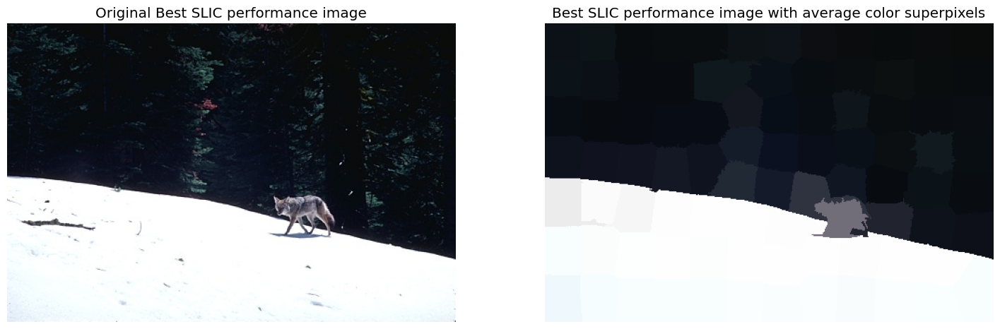

In [128]:
# Displaying the images
plt.figure(figsize=(18, 15))  
plt.subplot(1, 2, 1) # (rows, columns, panel number)
plt.imshow(I_slic_best)
plt.axis('off')
plt.title('Original Best SLIC performance image')


plt.subplot(1, 2, 2) # (rows, columns, panel number)
plt.imshow(I_avg_best)
plt.axis('off')
plt.title('Best SLIC performance image with average color superpixels')
plt.show()

The GCEs and LCEs for best SLIC performance image are displayed below:

In [129]:
print("The GCE for best SLIC performance image using color GT: ", GCE_color_sl[min_GCE_color_index_sl])
print("The LCE for best SLIC performance image using color GT: ", LCE_color_sl[min_GCE_color_index_sl])

print("The GCE for best SLIC performance image using grayscale GT: ", GCE_gray_sl[min_GCE_color_index_sl])
print("The LCE for best SLIC performance image using grayscale GT: ", LCE_gray_sl[min_GCE_color_index_sl])

The GCE for best SLIC performance image using color GT:  0.01871123288481093
The LCE for best SLIC performance image using color GT:  0.017462068832447795
The GCE for best SLIC performance image using grayscale GT:  0.1413208331685267
The LCE for best SLIC performance image using grayscale GT:  0.13718996971294545


SLIC segmentation performs best for the image shown above. This is because the best performance image contains only two main regions (dark and light) with one object. Also, there is a contrast presence between the objcet and the two main regions, which helps the SLIC segmentation to perform well in this image.

## Worse SLIC Performance:
We find the worse SLIC performance image using GCE for color GTs with compactness 20 and display the original worse performance image, and the worse SLIC performance image with average color superpixels.

In [130]:
max_GCE_color_sl = max(GCE_color_sl)
max_GCE_color_index_sl=GCE_color_sl.index(max_GCE_color_sl)

I_slic_worse=imageio.imread(image_filenames[max_GCE_color_index_sl])

I_slic_worse_slic=skimage.segmentation.slic(I_slic_worse, n_segments=100, compactness=20)

# Worse SLIC performance image with average color superpixels
I_avg_worse=Seg_avg_color(I_slic_worse,I_slic_worse_slic)

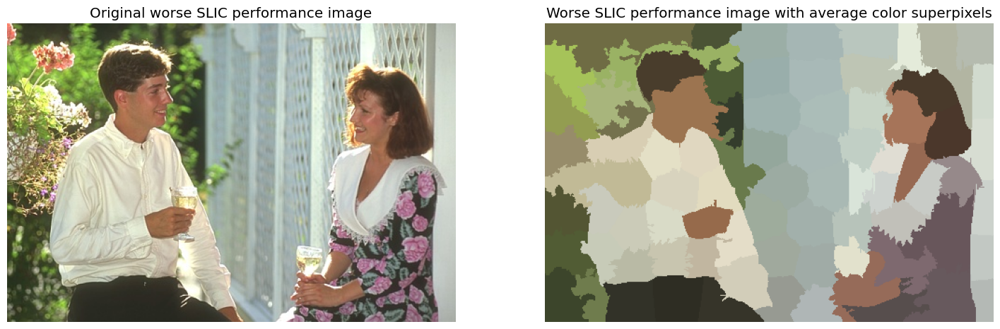

In [131]:
# Displaying the images
plt.figure(figsize=(18, 15))  
plt.subplot(1, 2, 1) # (rows, columns, panel number)
plt.imshow(I_slic_worse)
plt.axis('off')
plt.title('Original worse SLIC performance image')


plt.subplot(1, 2, 2) # (rows, columns, panel number)
plt.imshow(I_avg_worse)
plt.axis('off')
plt.title('Worse SLIC performance image with average color superpixels')
plt.show()

In [132]:
print("The GCE for worse SLIC performance image using color GT: ", GCE_color_sl[max_GCE_color_index_sl])
print("The LCE for worse SLIC performance image using color GT: ", LCE_color_sl[max_GCE_color_index_sl])

print("The GCE for worse SLIC performance image using grayscale GT: ", GCE_gray_sl[max_GCE_color_index_sl])
print("The LCE for worse SLIC performance image using grayscale GT: ", LCE_gray_sl[max_GCE_color_index_sl])

The GCE for worse SLIC performance image using color GT:  0.4125645242845284
The LCE for worse SLIC performance image using color GT:  0.37059534537982547
The GCE for worse SLIC performance image using grayscale GT:  0.154140766560538
The LCE for worse SLIC performance image using grayscale GT:  0.1363067479382434


The worse performance image using compactness parameter m=20 is different from the worse performance image we observe for m=10. The worse performance image using compactness parameter m=20 contains more complex structures with more color variations. The reflection and blurriness of the background makes it very hard to properly defined the superpixels for SLIC segmentation. Eventually, SLIC segmentation performs worse segmentation for this image.

## (e) Active Contours (Snakes)
In this section, we study the effect of evolution parameters and the initialization of the snake on the convergence of the active contours (snakes).

## (e-i) Active Contour Segmentation:
We read in the <b>elliptical-object-noisy.tif</b> image to variable <b>I</b> and define the initial snake 
in terms of pixel pairs. 

In [81]:
I = imageio.imread('elliptical-object-noisy.tif')

# define the initial snake
Nr, Nc = I.shape
k = 125
init_snake = np.block([[k*np.ones(Nc-2*k),\
np.asarray(range(k,Nr-2*k)), Nr-k*np.ones(Nc-2*k),\
np.asarray(range(Nr-k,k,-1))], [np.asarray(range(k,Nc-2*k)),\
Nc-k*np.ones(Nr-2*k),np.asarray(range(Nc-k,k,-1)),\
k*np.ones(Nr-2*k)]]).T

We compute the final position of the snake and display ellipse image with a green dashed initial snake 
and red final snake overlaid on the original image.

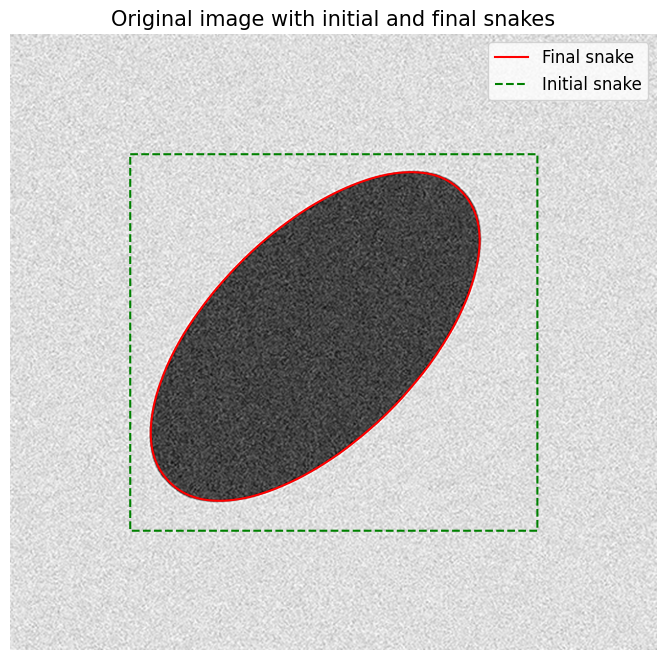

In [83]:
final_snake =skimage.segmentation.active_contour(skimage.filters.gaussian(I,5),\
            init_snake,alpha=0.5,beta=0,gamma=0.006,max_num_iter=500,coordinates='rc')

# Display original image with initial and final snakes
plt.figure(figsize=(10, 8)) 
plt.imshow(I, cmap='gray')
plt.plot(final_snake[:,1],final_snake[:,0], '-r', label='Final snake')
plt.plot(init_snake[:,1],init_snake[:,0], '--g', label='Initial snake')
plt.axis('off')
plt.title('Original image with initial and final snakes', fontsize = 15)
plt.legend();
plt.show()

## (e-ii) Evolution of the Active Contour:
We find the active contour location for 100, 200, 300, 400, and 500 iterations. 

In [84]:
final_snake_100 =skimage.segmentation.active_contour(skimage.filters.gaussian(I,5),\
            init_snake,alpha=0.5,beta=0,gamma=0.006,max_num_iter=100,coordinates='rc')
final_snake_200 =skimage.segmentation.active_contour(skimage.filters.gaussian(I,5),\
            init_snake,alpha=0.5,beta=0,gamma=0.006,max_num_iter=200,coordinates='rc')
final_snake_300 =skimage.segmentation.active_contour(skimage.filters.gaussian(I,5),\
            init_snake,alpha=0.5,beta=0,gamma=0.006,max_num_iter=300,coordinates='rc')
final_snake_400 =skimage.segmentation.active_contour(skimage.filters.gaussian(I,5),\
            init_snake,alpha=0.5,beta=0,gamma=0.006,max_num_iter=400,coordinates='rc')
final_snake_500 =skimage.segmentation.active_contour(skimage.filters.gaussian(I,5),\
            init_snake,alpha=0.5,beta=0,gamma=0.006,max_num_iter=500,coordinates='rc')

We display ellipse image with a green dashed initial snake and a red evolved snake overlaid on the original image for 100, 200, 300, 400, and 500 total iterations.

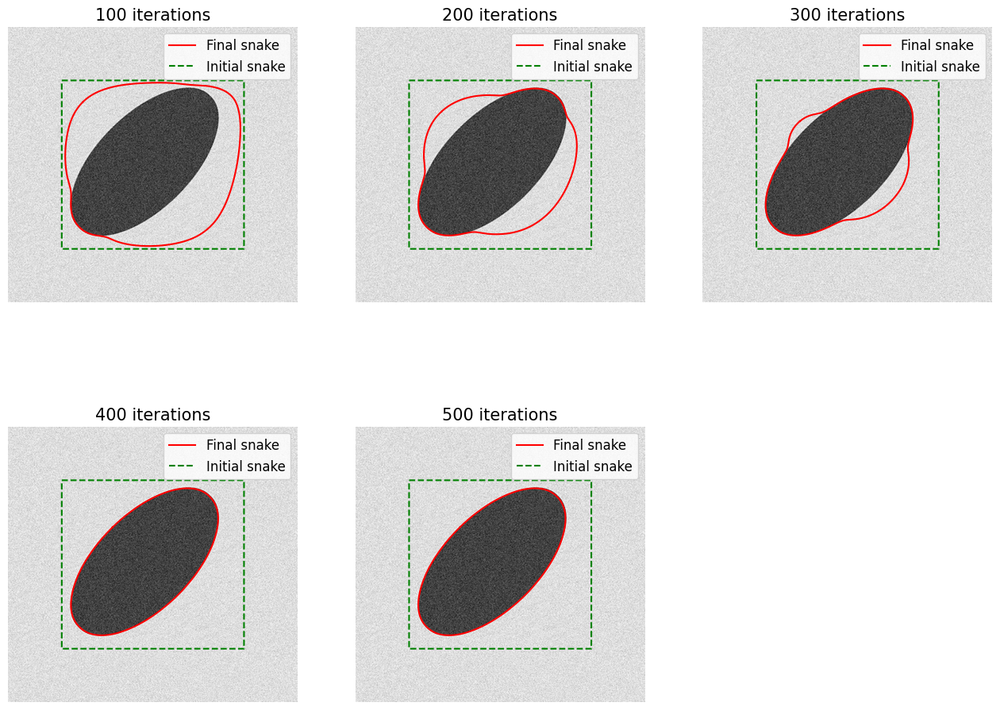

In [85]:
plt.figure(figsize=(16, 12))  
plt.subplot(2, 3, 1)
plt.imshow(I, cmap='gray')
plt.plot(final_snake_100[:,1],final_snake_100[:,0], '-r', label='Final snake')
plt.plot(init_snake[:,1],init_snake[:,0], '--g', label='Initial snake')
plt.axis('off')
plt.title('100 iterations', fontsize = 15)
plt.legend();

plt.subplot(2, 3, 2)
plt.imshow(I, cmap='gray')
plt.plot(final_snake_200[:,1],final_snake_200[:,0], '-r', label='Final snake')
plt.plot(init_snake[:,1],init_snake[:,0], '--g', label='Initial snake')
plt.axis('off')
plt.title('200 iterations', fontsize = 15)
plt.legend();

plt.subplot(2, 3, 3)
plt.imshow(I, cmap='gray')
plt.plot(final_snake_300[:,1],final_snake_300[:,0], '-r', label='Final snake')
plt.plot(init_snake[:,1],init_snake[:,0], '--g', label='Initial snake')
plt.axis('off')
plt.title('300 iterations', fontsize = 15)
plt.legend();

plt.subplot(2, 3, 4)
plt.imshow(I, cmap='gray')
plt.plot(final_snake_400[:,1],final_snake_400[:,0], '-r', label='Final snake')
plt.plot(init_snake[:,1],init_snake[:,0], '--g', label='Initial snake')
plt.axis('off')
plt.title('400 iterations', fontsize = 15)
plt.legend();

plt.subplot(2, 3, 5)
plt.imshow(I, cmap='gray')
plt.plot(final_snake_500[:,1],final_snake_500[:,0], '-r', label='Final snake')
plt.plot(init_snake[:,1],init_snake[:,0], '--g', label='Initial snake')
plt.axis('off')
plt.title('500 iterations', fontsize = 15)
plt.legend();
plt.show()

## (e-iii) Sensitivity of Active Contours to Parameters: 
In this subpart, we explore the effects of α , β , and γ on active contours. The parameter α is a constant that controls the elastic energy of the contour, β controls the bending (smoothness) of the curve, and γ controls the external force.

## Set α=0.1 and leave β=0 , γ=0.006 

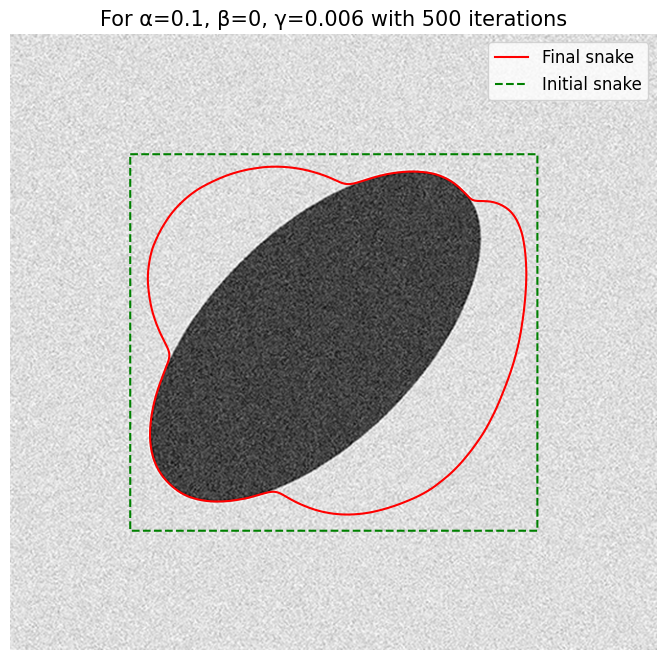

In [86]:
final_snake_500_alp1_gam1 =skimage.segmentation.active_contour(skimage.filters.gaussian(I,5),\
            init_snake,alpha=0.1,beta=0,gamma=0.006,max_num_iter=500,coordinates='rc')

plt.figure(figsize=(10, 8))  
plt.imshow(I, cmap='gray')
plt.plot(final_snake_500_alp1_gam1[:,1],final_snake_500_alp1_gam1[:,0], '-r', label='Final snake')
plt.plot(init_snake[:,1],init_snake[:,0], '--g', label='Initial snake')
plt.axis('off')
plt.title('For α=0.1, β=0, γ=0.006 with 500 iterations', fontsize = 15)
plt.legend();
plt.show()

α value is reduced compare to (e-i). By reducing α value, elastic energy of the contour is reduced. As a result, the final snake has not converged with 500 iterations.

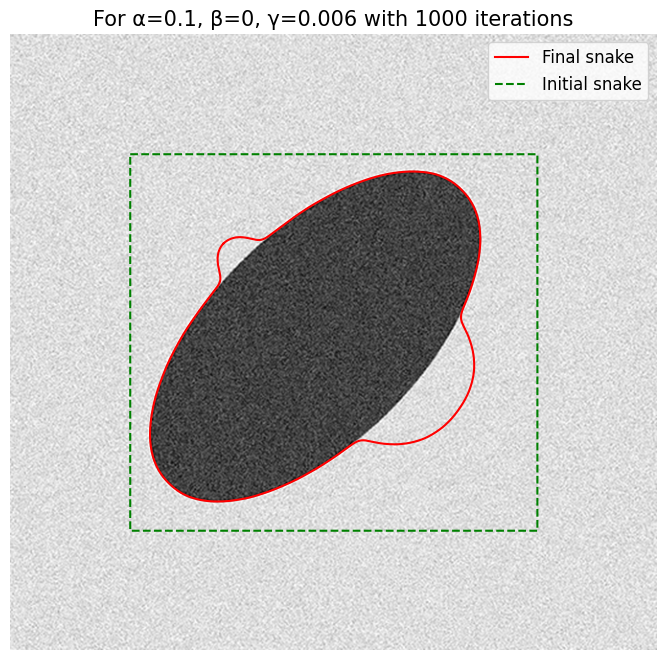

In [87]:
final_snake_1000_alp1_gam1 =skimage.segmentation.active_contour(skimage.filters.gaussian(I,5),\
            init_snake,alpha=0.1,beta=0,gamma=0.006,max_num_iter=1000,coordinates='rc')

plt.figure(figsize=(10, 8))  
plt.imshow(I, cmap='gray')
plt.plot(final_snake_1000_alp1_gam1[:,1],final_snake_1000_alp1_gam1[:,0], '-r', label='Final snake')
plt.plot(init_snake[:,1],init_snake[:,0], '--g', label='Initial snake')
plt.axis('off')
plt.title('For α=0.1, β=0, γ=0.006 with 1000 iterations', fontsize = 15)
plt.legend();
plt.show()

With α =0.1, if we increase the maximum number of iteration to 1000, we can see the final snake position changes and goes close to the boundary compared to the position with 500 iterations. Increasing maximum number of iteration will result in better performance with respect to convergence.

## Set α=5 and leave β=0 , γ=0.006

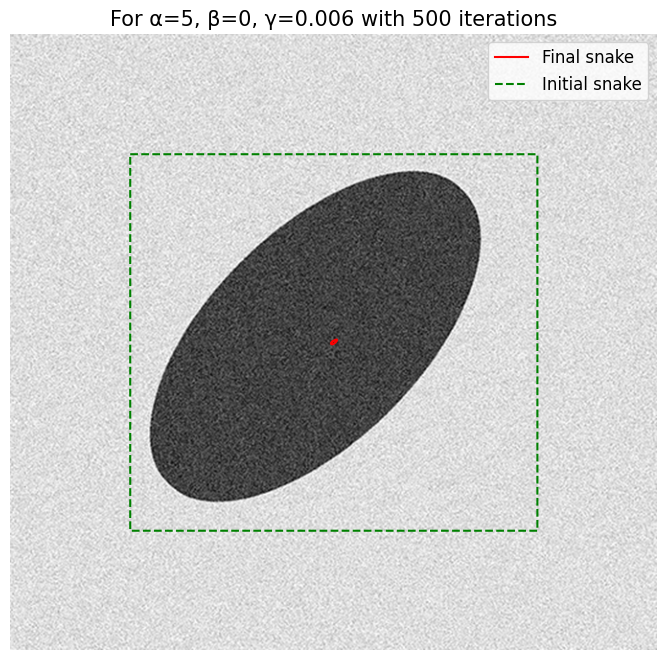

In [90]:
final_snake_500_alp2_gam1 =skimage.segmentation.active_contour(skimage.filters.gaussian(I,5),\
            init_snake,alpha=5,beta=0,gamma=0.006,max_num_iter=500,coordinates='rc')

plt.figure(figsize=(10, 8))  
plt.imshow(I, cmap='gray')
plt.plot(final_snake_500_alp2_gam1[:,1],final_snake_500_alp2_gam1[:,0], '-r', label='Final snake')
plt.plot(init_snake[:,1],init_snake[:,0], '--g', label='Initial snake')
plt.axis('off')
plt.title('For α=5, β=0, γ=0.006 with 500 iterations', fontsize = 15)
plt.legend();
plt.show()

By making α =5, the elastic energy of the contour increases in a extreme manner. As a result, the final snake 
misses the boundary of the image and looks like a point. The curve appears to be done evolving. 

## Set β=1 and leave α=0.5 , γ=0.006

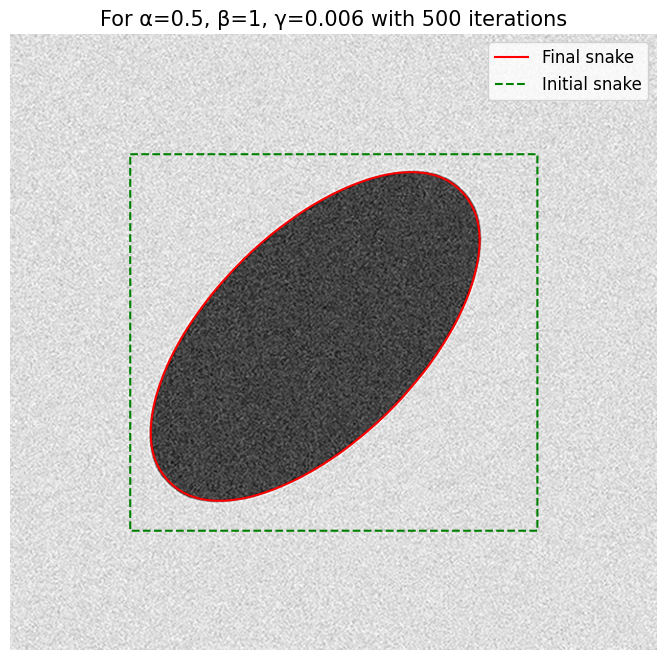

In [91]:
final_snake_500_alp3_beta_gam1 =skimage.segmentation.active_contour(skimage.filters.gaussian(I,5),\
            init_snake,alpha=0.5,beta=1,gamma=0.006,max_num_iter=500,coordinates='rc')

plt.figure(figsize=(10, 8))  
plt.imshow(I, cmap='gray')
plt.plot(final_snake_500_alp3_beta_gam1[:,1],final_snake_500_alp3_beta_gam1[:,0], '-r', label='Final snake')
plt.plot(init_snake[:,1],init_snake[:,0], '--g', label='Initial snake')
plt.axis('off')
plt.title('For α=0.5, β=1, γ=0.006 with 500 iterations', fontsize = 15)
plt.legend();
plt.show()

With β=1, we incerase the bending of the curve. The final snake is converged and the curve appear to be done evolving. We did not see any significant difference for final snake compared to (e-i).

## Set γ=0.6 and leave α=0.5 , β=0

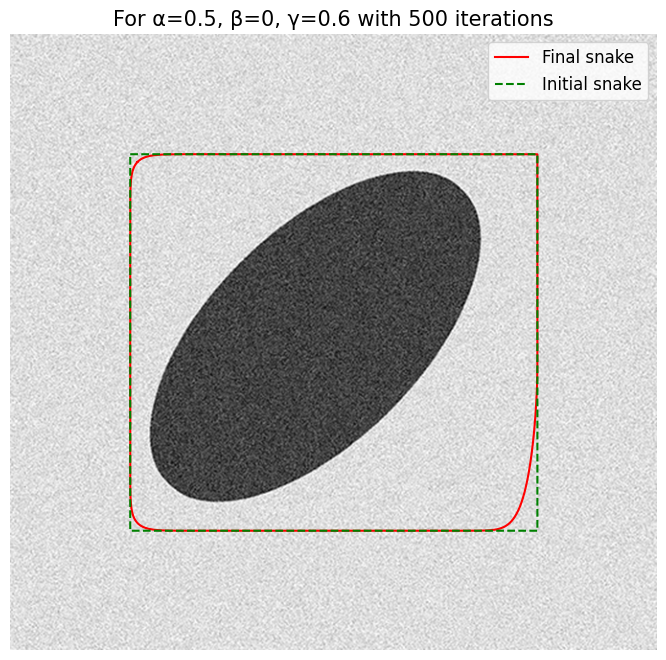

In [92]:
final_snake_500_alp3_gam2 =skimage.segmentation.active_contour(skimage.filters.gaussian(I,5),\
            init_snake,alpha=0.5,beta=0,gamma=0.6,max_num_iter=500,coordinates='rc')

plt.figure(figsize=(10, 8))  
plt.imshow(I, cmap='gray')
plt.plot(final_snake_500_alp3_gam2[:,1],final_snake_500_alp3_gam2[:,0], '-r', label='Final snake')
plt.plot(init_snake[:,1],init_snake[:,0], '--g', label='Initial snake')
plt.axis('off')
plt.title('For α=0.5, β=0, γ=0.6 with 500 iterations', fontsize = 15)
plt.legend();
plt.show()

By changing γ value to 0.6 with α=0.5, β=0, the pusing force becomes very small. As a result, the final snake stays in almost same position compared to initial snake.

## Set γ=6e-6 and leave α=0.5 , β=0 

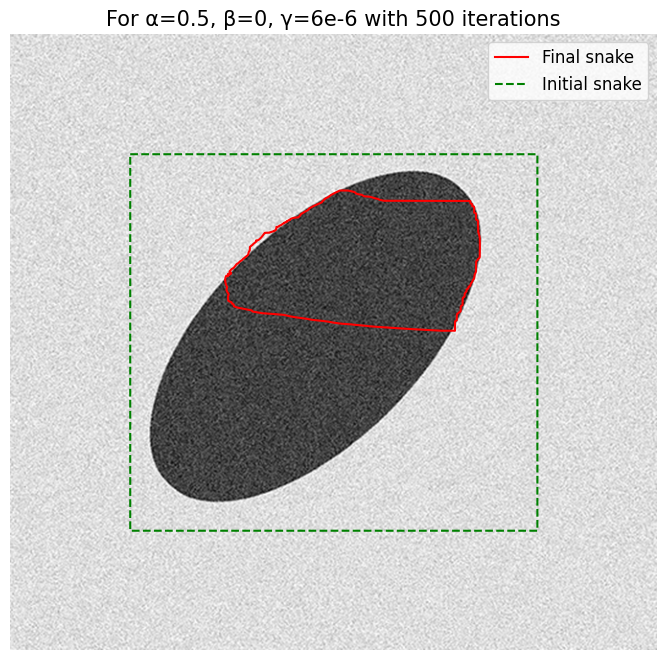

In [93]:
final_snake_500_alp3_gam3 =skimage.segmentation.active_contour(skimage.filters.gaussian(I,5),\
            init_snake,alpha=0.5,beta=0,gamma=6e-6,max_num_iter=500,coordinates='rc')

plt.figure(figsize=(10, 8))  
plt.imshow(I, cmap='gray')
plt.plot(final_snake_500_alp3_gam3[:,1],final_snake_500_alp3_gam3[:,0], '-r', label='Final snake')
plt.plot(init_snake[:,1],init_snake[:,0], '--g', label='Initial snake')
plt.axis('off')
plt.title('For α=0.5, β=0, γ=6e-6 with 500 iterations', fontsize = 15)
plt.legend();
plt.show()

By changing γ value to 6e-6 with α=0.5, β=0, the pushing force increases too much compare to pulling force. Hence, the final snake misses boundaries for most of the time in the image.

## (e-iv) Sensitivity of Active Contours to Snake Initialization: 
In this subpart, we explore the effect of snake initialization on active countours.

## Case 1: k=10

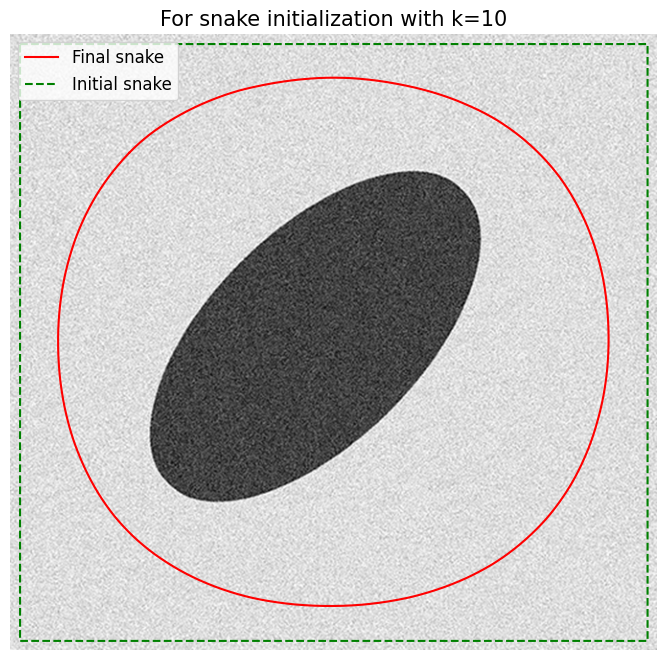

In [94]:
k=10
init_snake = np.block([[k*np.ones(Nc-2*k),\
np.asarray(range(k,Nr-2*k)), Nr-k*np.ones(Nc-2*k),\
np.asarray(range(Nr-k,k,-1))], [np.asarray(range(k,Nc-2*k)),\
Nc-k*np.ones(Nr-2*k),np.asarray(range(Nc-k,k,-1)),\
k*np.ones(Nr-2*k)]]).T

final_snake =skimage.segmentation.active_contour(skimage.filters.gaussian(I,5),\
            init_snake,alpha=0.5,beta=0,gamma=0.006,max_num_iter=500,coordinates='rc')

plt.figure(figsize=(10, 8)) 
plt.imshow(I, cmap='gray')
plt.plot(final_snake[:,1],final_snake[:,0], '-r', label='Final snake')
plt.plot(init_snake[:,1],init_snake[:,0], '--g', label='Initial snake')
plt.axis('off')
plt.title('For snake initialization with k=10', fontsize = 15)
plt.legend(loc="upper left");
plt.show()

With k=10, the final snake is far away from the boundary. Using this initialization with α=0.5, β=0, γ=0.006,
the algorithm does not produce enough pushing force for the final snake to be converged. By channging α, β, γ, improvement might be possible with respect to the convergence of the final snake.

## Case 2: k=175

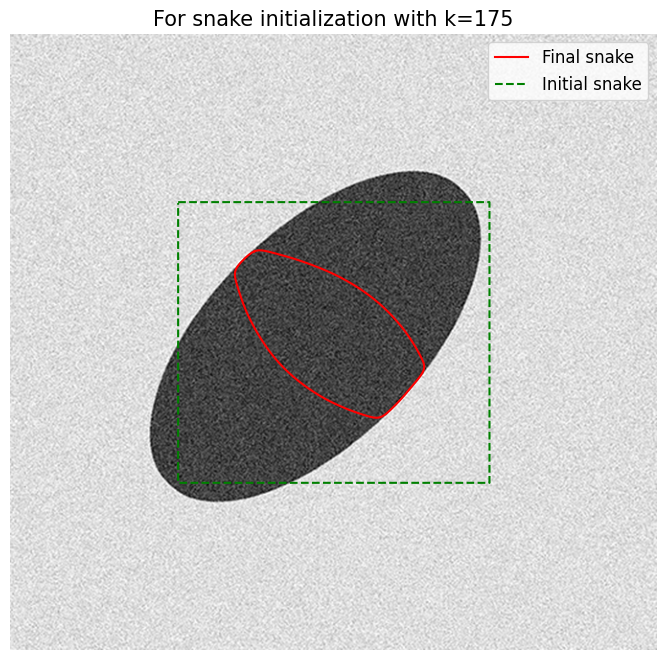

In [95]:
k=175
init_snake = np.block([[k*np.ones(Nc-2*k),\
np.asarray(range(k,Nr-2*k)), Nr-k*np.ones(Nc-2*k),\
np.asarray(range(Nr-k,k,-1))], [np.asarray(range(k,Nc-2*k)),\
Nc-k*np.ones(Nr-2*k),np.asarray(range(Nc-k,k,-1)),\
k*np.ones(Nr-2*k)]]).T

final_snake =skimage.segmentation.active_contour(skimage.filters.gaussian(I,5),\
            init_snake,alpha=0.5,beta=0,gamma=0.006,max_num_iter=500,coordinates='rc')

plt.figure(figsize=(10, 8)) 
plt.imshow(I, cmap='gray')
plt.plot(final_snake[:,1],final_snake[:,0], '-r', label='Final snake')
plt.plot(init_snake[:,1],init_snake[:,0], '--g', label='Initial snake')
plt.axis('off')
plt.title('For snake initialization with k=175', fontsize = 15)
plt.legend();
plt.show()

 With k=175, the initialization is not good as it does not cover the whole object and misses boundaries in different sides of the object. Using this bad initialization with α=0.5, β=0, γ=0.006, pushing force takes the charge compared to pulling force. Hence, the final snake misses boundaries in most of the time in the image. 

## (e-v) Optimization of Active Contours for a Dataset:
It would be very difficult to optimize the active contour parameters and initialization across the BSDS dataset. There are various natural scene images in the BSDS dataset. Some images have single object and some images have mutiple objects. Active countour (snakes) deals with only one snake and thus segmentation of the image into only two regions, foreground and background. For multiple objects in a image, multiple initialization can be introduced, which is a very challenging task. Also, the position of the object in the images does not follow any exact pattern and the structure of the objects are different to each other as these are natural scene images. As a result, we might need to select  initialization, α, β, γ values seperately for each image, which is not a efficient approach. Thus, it would be very challenging to optimize the active contour parameters and initialization across the BSDS dataset. 



## (f) Active Contours Without Edges (ACWE)
In this section, we explore active contours without edges (ACWE) algorithm. We analyze the segmentation performance of ACWE method on BSDS dataset.

## (f-i) ACWE Segmentation: 
We compute the ACWE segmentation for the <b>100075.jpg</b> image. We display ACWE segmented image as the original color <b>100075.jpg</b> image with overlaid red lines for the ACWE contour. 

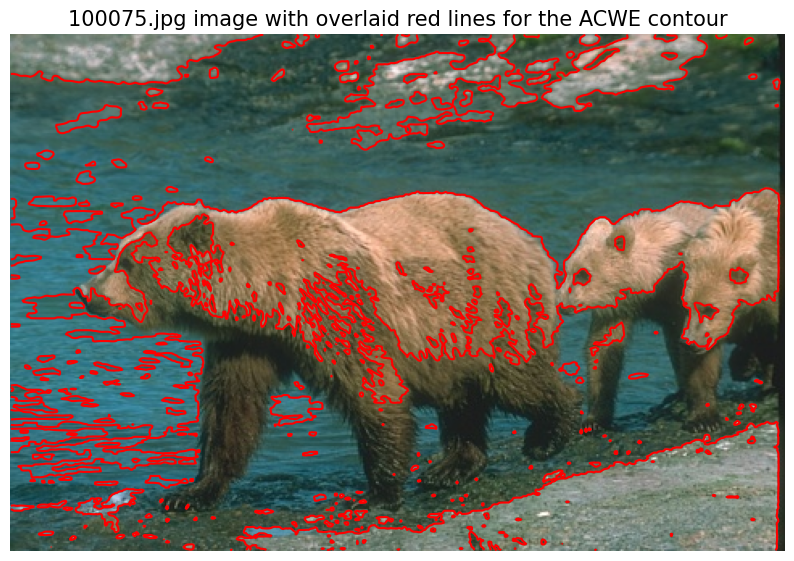

In [97]:
I = imageio.imread('BSDS300/images/train/100075.jpg')
I_gray=skimage.color.rgb2gray(I)

I_acwe,phi,energies=skimage.segmentation.chan_vese(I_gray,mu=0.01,tol\
=1e-3,max_num_iter=500,init_level_set='checkerboard',extended_output=True)

plt.figure(figsize=(10, 8)) 
plt.imshow(I)
plt.contour(phi,0,colors = 'red')
plt.axis('off')
plt.title('100075.jpg image with overlaid red lines for the ACWE contour', fontsize = 15)
plt.show()

We convert the ACWE segmentation to a label image <b>Seg</b> and display the label image.

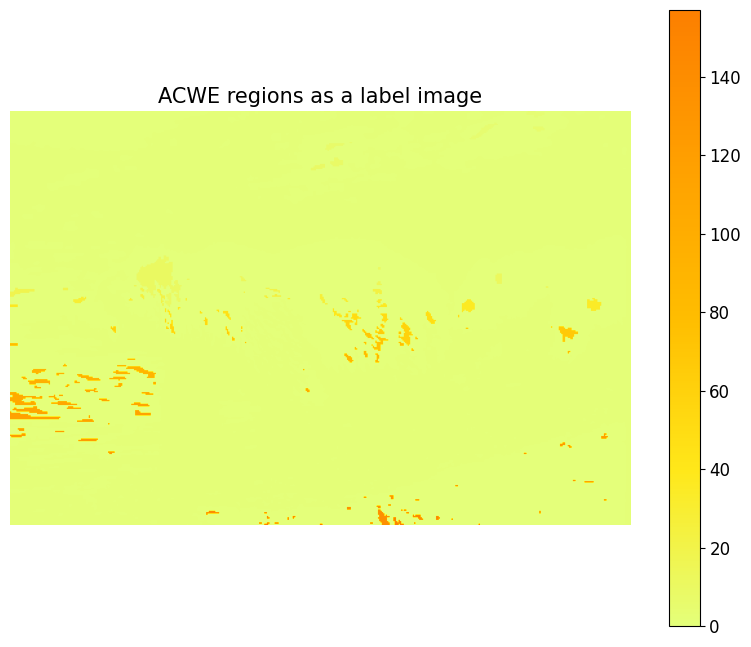

In [99]:
Seg=skimage.measure.label(I_acwe)

plt.figure(figsize=(10, 8)) 
plt.imshow(Seg, cmap = 'Wistia')
plt.axis('off')
plt.colorbar()
plt.title('ACWE regions as a label image', fontsize = 15)
plt.show()

We use the label image <b>Seg</b> to compute the GCE and LCE for the <b>100075.jpg</b> image.

In [100]:
GT_color = imageio.imread('BSDS300/masks/color/train/100075.png')
[GCE_c_s,LCE_c_s]=compute_GCE_LCE(Seg,GT_color)

print("The GCE for GT with color version is: ", GCE_c_s)
print("The LCE for GT with color version is: ", LCE_c_s)

GT_gray = imageio.imread('BSDS300/masks/gray/train/100075.png')
[GCE_g_s,LCE_g_s]=compute_GCE_LCE(Seg,GT_gray)

print("The GCE for GT with graysacale version is: ", GCE_g_s)
print("The LCE for GT with grayscale version is: ", LCE_g_s)

The GCE for GT with color version is:  0.36399451348031153
The LCE for GT with color version is:  0.3468331280404735
The GCE for GT with graysacale version is:  0.48034479101855704
The LCE for GT with grayscale version is:  0.46007791947167687


## (f-ii) ACWE Segmentation as Average Color Regions:
We use <b>Seg_avg_color</b> function to assign each region in the ACWE label image to have the average color of all pixels within that region. We display the average color region image for the ACWE segmentation of the <b>100075.jpg</b> image.

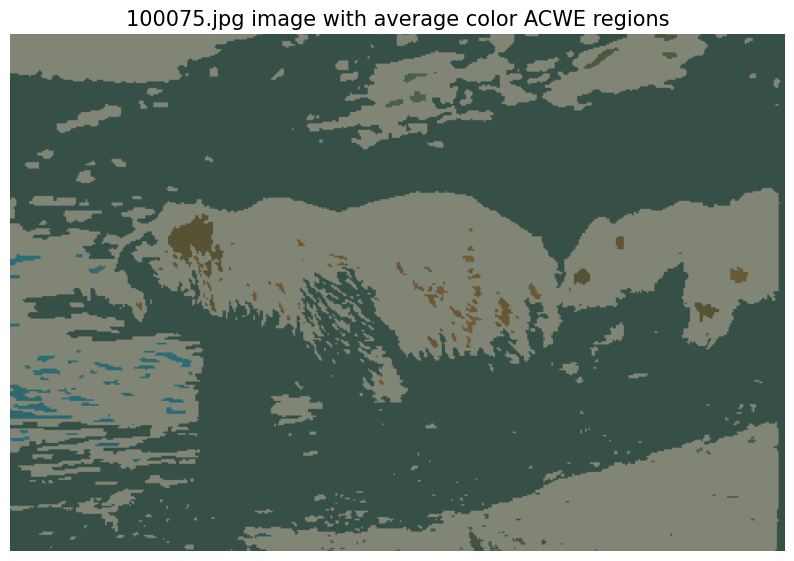

In [101]:
I_avg_acw=Seg_avg_color(I,Seg)

plt.figure(figsize=(10, 8)) 
plt.imshow(I_avg_acw)
plt.axis('off')
plt.title('100075.jpg image with average color ACWE regions', fontsize = 15)
plt.show()

## (f-iii) ACWE Segmentation Performance:
We loop over all 100 test images in the BSDS, apply ACWE segmentation with the mentioned parameter choices, and compute the GCE and LCE for each image, as compared to both the grayscale and color GTs. We display the performance of the ACWE algorithm as the average error plus/minus the standard deviation.

In [102]:
image_directory = 'BSDS300/images/test/'
color_directory='BSDS300/masks/color/test/'
gray_directory='BSDS300/masks/gray/test/'

image_filenames = sorted(glob.glob(image_directory+'*.jpg'))  
color_GT_filenames = sorted(glob.glob(color_directory+'*.png')) 
gray_GT_filenames = sorted(glob.glob(gray_directory+'*.png')) 

GCE_color_sl=[]
LCE_color_sl=[]
GCE_gray_sl=[]
LCE_gray_sl=[]

begin_time_slic=time.time()

for f,image_filename in enumerate(image_filenames):
    I_ii=imageio.imread(image_filename)
    I_gray=skimage.color.rgb2gray(I_ii)
    I_acwe,phi,energies=skimage.segmentation.chan_vese(I_gray,mu=0.01,tol\
    =1e-3,max_num_iter=500,init_level_set='checkerboard',extended_output=True)
    Seg=skimage.measure.label(I_acwe)
    
    I_color=imageio.imread(color_GT_filenames[f])
    [GCE_cl_sl,LCE_cl_sl]=compute_GCE_LCE(Seg,I_color)
    GCE_color_sl.append(GCE_cl_sl)
    LCE_color_sl.append(LCE_cl_sl)
    
    I_gr=imageio.imread(gray_GT_filenames[f])
    [GCE_gr_sl,LCE_gr_sl]=compute_GCE_LCE(Seg,I_gr)
    GCE_gray_sl.append(GCE_gr_sl)
    LCE_gray_sl.append(LCE_gr_sl)
    
    
total_time_slic= time.time() - begin_time_slic
GCE_color_mean_sl=sum(GCE_color_sl) / len(GCE_color_sl)
LCE_color_mean_sl=sum(LCE_color_sl) / len(LCE_color_sl)
GCE_color_std_sl=np.std(GCE_color_sl)
LCE_color_std_sl=np.std(LCE_color_sl)



GCE_gray_mean_sl=sum(GCE_gray_sl) / len(GCE_gray_sl)
LCE_gray_mean_sl=sum(LCE_gray_sl) / len(LCE_gray_sl)
GCE_gray_std_sl=np.std(GCE_gray_sl)
LCE_gray_std_sl=np.std(LCE_gray_sl)

print("Total time taken: ", total_time_slic, "s")
print("GCE for color GT: ", GCE_color_mean_sl, "\u00B1", GCE_color_std_sl)
print("LCE for color GT: ", LCE_color_mean_sl, "\u00B1", LCE_color_std_sl)
print("GCE for grayscale GT: ", GCE_gray_mean_sl, "\u00B1", GCE_gray_std_sl)
print("LCE for grayscale GT: ", LCE_gray_mean_sl, "\u00B1", LCE_gray_std_sl)

Total time taken:  846.6728382110596 s
GCE for color GT:  0.26755635351899465 ± 0.12659572049723913
LCE for color GT:  0.2089896838166392 ± 0.10357504184177198
GCE for grayscale GT:  0.27986904058428885 ± 0.12372426849023627
LCE for grayscale GT:  0.21906668693555967 ± 0.10328257827717438


From the above results, we find that GCE and LCE values using grayscale GTs are more compared to GCE and LCE values using color GTs for ACWE segmentation. We also find that GCE and LCE values of ACWE segmentation are more compared to GCE and LCE values of SLIC superpixel segmentation. Thus, SLIC superpixel segmentation performs better than ACWE segmentation if we use GCE and LCE as performance measure. We also observe that the ACWE segmentation is very slow compared to SLIC superpixel segmentation.

## (f-iv) Best and Worst ACWE Performance: 
We will utilize GCE using color GTs to find the best and worse ACWE performance images. We choose GCE using color GTs here to compare the performance of ACWE segmentation with the performance of SLIC superpixel segmentation.

## Best ACWE Performance
We find the best ACWE performance image using GCE for color GTs and display the original best performance image, and the best ACWE performance image with average color ACWE regions.

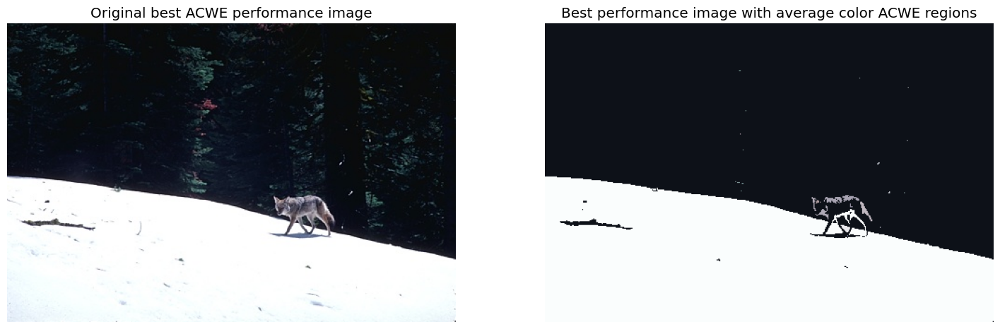

In [104]:
min_GCE_color_sl = min(GCE_color_sl)
min_GCE_color_index_sl=GCE_color_sl.index(min_GCE_color_sl)

I_ACWE_best=imageio.imread(image_filenames[min_GCE_color_index_sl])
I_gray=skimage.color.rgb2gray(I_ACWE_best)
I_acwe,phi,energies=skimage.segmentation.chan_vese(I_gray,mu=0.01,tol\
=1e-3,max_num_iter=500,init_level_set='checkerboard',extended_output=True)

Seg_b=skimage.measure.label(I_acwe)

I_avg_acw_best=Seg_avg_color(I_ACWE_best,Seg_b)

# Displaying the images
plt.figure(figsize=(18, 15))  
plt.subplot(1, 2, 1) 
plt.imshow(I_ACWE_best)
plt.axis('off')
plt.title('Original best ACWE performance image')


plt.subplot(1, 2, 2) 
plt.imshow(I_avg_acw_best)
plt.axis('off')
plt.title('Best performance image with average color ACWE regions')
plt.show()

In [106]:
print("The GCE for best ACWE performance image using color GT: ", GCE_color_sl[min_GCE_color_index_sl])
print("The LCE for best ACWE performance image using color GT: ", LCE_color_sl[min_GCE_color_index_sl])

print("The GCE for best ACWE performance image using grayscale GT: ", GCE_gray_sl[min_GCE_color_index_sl])
print("The LCE for best ACWE performance image using grayscale GT: ", LCE_gray_sl[min_GCE_color_index_sl])

The GCE for best ACWE performance image using color GT:  0.016845037371469744
The LCE for best ACWE performance image using color GT:  0.010848805521991859
The GCE for best ACWE performance image using grayscale GT:  0.012845987978471338
The LCE for best ACWE performance image using grayscale GT:  0.009611762245805639


If we compare this best ACWE performance image of  average color ACWE regions with the best SLIC performance image of  average color superpixels (as the best performance original images are same in both cases), we can say the ACWE performs better on this image compared to SLIC segmentation. 
ACWE algoritm perfoms segmentation based on the properties of the regions. The best performance image has two contrast backgroud regions. There is also contrast presence between the foreground and background. By using this contrast property, ACWE performs segmenation quite well. The object is easily detectable in the average color segmented image for ACWE segmentation. 

## Worse ACWE Performance
We find the worse ACWE performance image using GCE for color GTs and display the original worse performance image, and the worse ACWE performance image with average color ACWE regions.

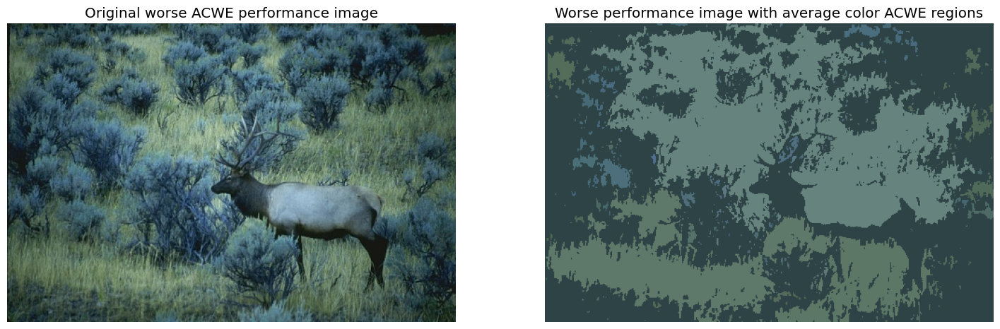

In [108]:
max_GCE_color_sl = max(GCE_color_sl)
max_GCE_color_index_sl=GCE_color_sl.index(max_GCE_color_sl)

I_ACWE_worse=imageio.imread(image_filenames[max_GCE_color_index_sl])
I_gray=skimage.color.rgb2gray(I_ACWE_worse)
I_acwe,phi,energies=skimage.segmentation.chan_vese(I_gray,mu=0.01,tol\
=1e-3,max_num_iter=500,init_level_set='checkerboard',extended_output=True)

Seg_w=skimage.measure.label(I_acwe)

I_avg_acw_worse=Seg_avg_color(I_ACWE_worse,Seg_w)

# Displaying the images
plt.figure(figsize=(18, 15))  
plt.subplot(1, 2, 1) 
plt.imshow(I_ACWE_worse)
plt.axis('off')
plt.title('Original worse ACWE performance image')


plt.subplot(1, 2, 2) 
plt.imshow(I_avg_acw_worse)
plt.axis('off')
plt.title('Worse performance image with average color ACWE regions')
plt.show()

In [109]:
print("The GCE for worse ACWE performance image using color GT: ", GCE_color_sl[max_GCE_color_index_sl])
print("The LCE for worse ACWE performance image using color GT: ", LCE_color_sl[max_GCE_color_index_sl])

print("The GCE for worse ACWE performance image using grayscale GT: ", GCE_gray_sl[max_GCE_color_index_sl])
print("The LCE for worse ACWE performance image using grayscale GT: ", LCE_gray_sl[max_GCE_color_index_sl])

The GCE for worse ACWE performance image using color GT:  0.5576143579032307
The LCE for worse ACWE performance image using color GT:  0.43893050736799927
The GCE for worse ACWE performance image using grayscale GT:  0.4805842190273106
The LCE for worse ACWE performance image using grayscale GT:  0.40870665904962006


ACWE segmentation performs worse for this image. The background of the image has complicated structures. As a result, it is difficult for ACWE method to use the property of the regions to perform the segmentation properly. Although it detects the edges quite well, it considers some part of the deer as background.

## (f-v) Optimize ACWE Segmentation Performance: 
We loop over a range of smoothness parameters, keyword mu in code and parameter μ in the textbook and compute the average and standard deviation of the GCE and LCE on 200 training images.

In [110]:
image_directory = 'BSDS300/images/train/'
color_directory='BSDS300/masks/color/train/'
gray_directory='BSDS300/masks/gray/train/'

image_filenames = sorted(glob.glob(image_directory+'*.jpg'))  
color_GT_filenames = sorted(glob.glob(color_directory+'*.png')) 
gray_GT_filenames = sorted(glob.glob(gray_directory+'*.png')) 

GCE_color_mean_sl_m=[]
LCE_color_mean_sl_m=[]
GCE_color_std_sl_m=[]
LCE_color_std_sl_m=[]

GCE_gray_mean_sl_m=[]
LCE_gray_mean_sl_m=[]
GCE_gray_std_sl_m=[]
LCE_gray_std_sl_m=[]

for m in range(0, 25, 3):
    GCE_color_sl=[]
    LCE_color_sl=[]
    GCE_gray_sl=[]
    LCE_gray_sl=[]
    for f,image_filename in enumerate(image_filenames):
        I_ii=imageio.imread(image_filename)
        I_gray=skimage.color.rgb2gray(I_ii)
        I_acwe,phi,energies=skimage.segmentation.chan_vese(I_gray,mu=m/100,tol\
        =1e-3,max_num_iter=500,init_level_set='checkerboard',extended_output=True)
        Seg=skimage.measure.label(I_acwe)
    
        I_color=imageio.imread(color_GT_filenames[f])
        [GCE_cl_sl,LCE_cl_sl]=compute_GCE_LCE(Seg,I_color)
        GCE_color_sl.append(GCE_cl_sl)
        LCE_color_sl.append(LCE_cl_sl)
    
        I_gr=imageio.imread(gray_GT_filenames[f])
        [GCE_gr_sl,LCE_gr_sl]=compute_GCE_LCE(Seg,I_gr)
        GCE_gray_sl.append(GCE_gr_sl)
        LCE_gray_sl.append(LCE_gr_sl)
    
    GCE_color_mean_sl=sum(GCE_color_sl) / len(GCE_color_sl)
    LCE_color_mean_sl=sum(LCE_color_sl) / len(LCE_color_sl)
    GCE_color_std_sl=np.std(GCE_color_sl)
    LCE_color_std_sl=np.std(LCE_color_sl) 
    
    GCE_color_mean_sl_m.append(GCE_color_mean_sl)
    LCE_color_mean_sl_m.append(LCE_color_mean_sl)
    GCE_color_std_sl_m.append(GCE_color_std_sl)
    LCE_color_std_sl_m.append(LCE_color_std_sl)
    
    
    GCE_gray_mean_sl=sum(GCE_gray_sl) / len(GCE_gray_sl)
    LCE_gray_mean_sl=sum(LCE_gray_sl) / len(LCE_gray_sl)
    GCE_gray_std_sl=np.std(GCE_gray_sl)
    LCE_gray_std_sl=np.std(LCE_gray_sl)
    
    GCE_gray_mean_sl_m.append(GCE_gray_mean_sl)
    LCE_gray_mean_sl_m.append(LCE_gray_mean_sl)
    GCE_gray_std_sl_m.append(GCE_gray_std_sl)
    LCE_gray_std_sl_m.append(LCE_gray_std_sl)
    

The error bar plots of the error measures versus smoothness as computed over the 200 training images are shown below:

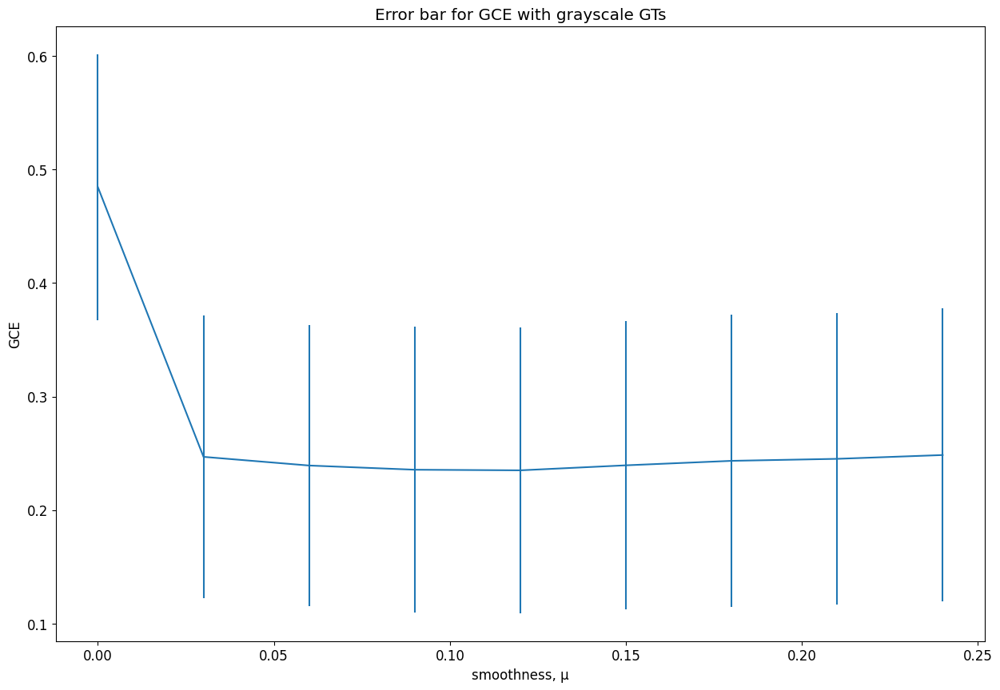

In [117]:
plt.figure(figsize=(15,10))
plt.errorbar(np.linspace(0,0.24,9),GCE_gray_mean_sl_m,yerr=GCE_gray_std_sl_m)
plt.xlabel('smoothness, μ')
plt.ylabel('GCE')
plt.title('Error bar for GCE with grayscale GTs')
plt.show()

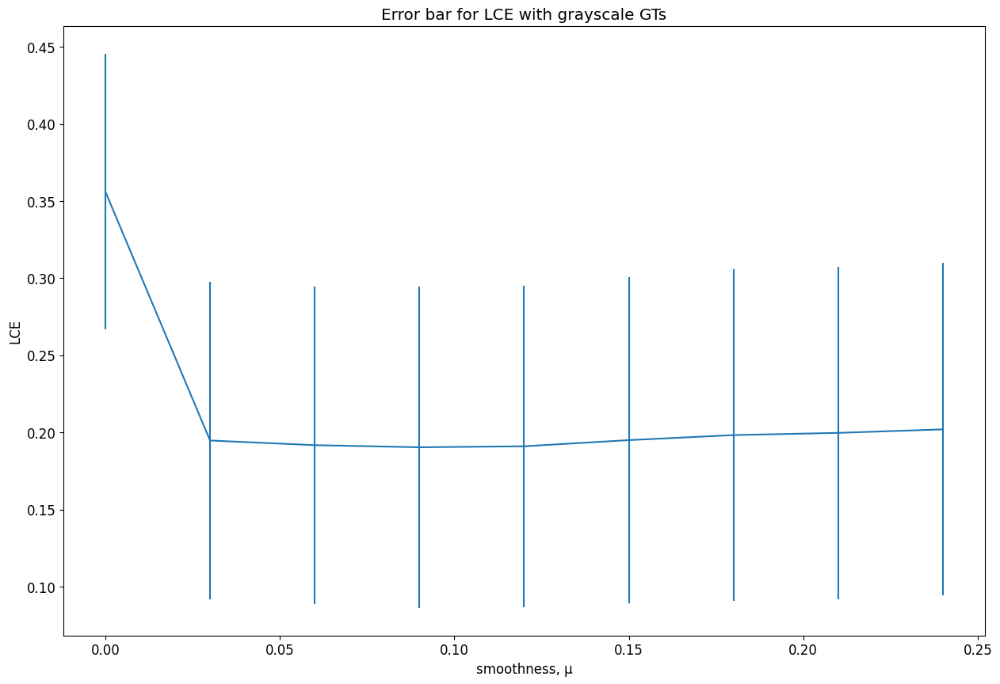

In [118]:
plt.figure(figsize=(15,10))
plt.errorbar(np.linspace(0,0.24,9),LCE_gray_mean_sl_m,yerr=LCE_gray_std_sl_m)
plt.xlabel('smoothness, μ')
plt.ylabel('LCE')
plt.title('Error bar for LCE with grayscale GTs')
plt.show()

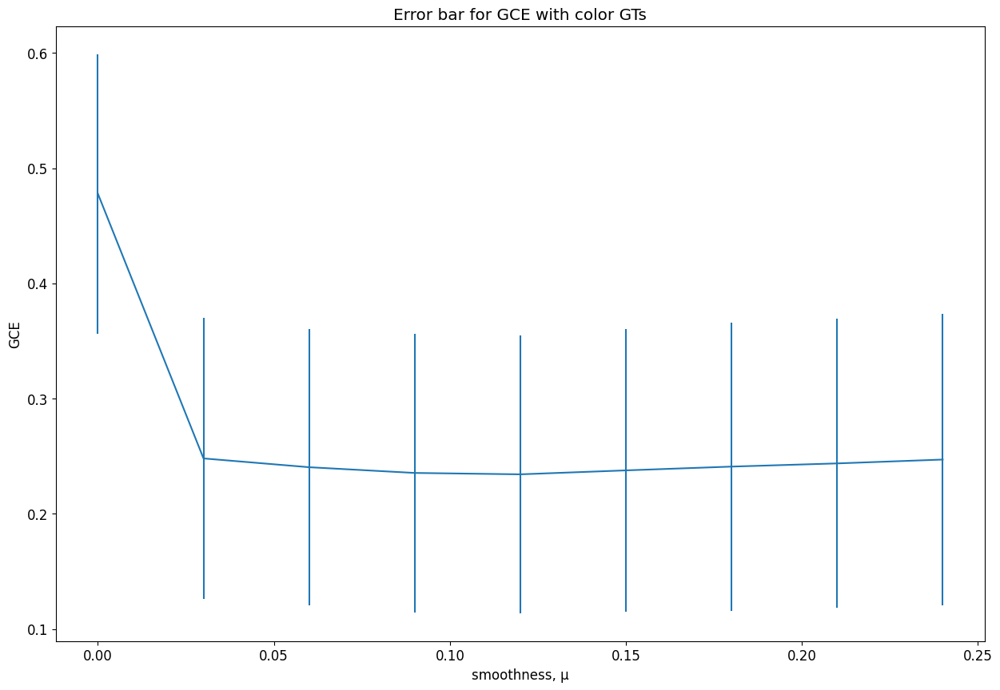

In [119]:
plt.figure(figsize=(15,10))
plt.errorbar(np.linspace(0,0.24,9),GCE_color_mean_sl_m,yerr=GCE_color_std_sl_m)
plt.xlabel('smoothness, μ')
plt.ylabel('GCE')
plt.title('Error bar for GCE with color GTs')
plt.show()

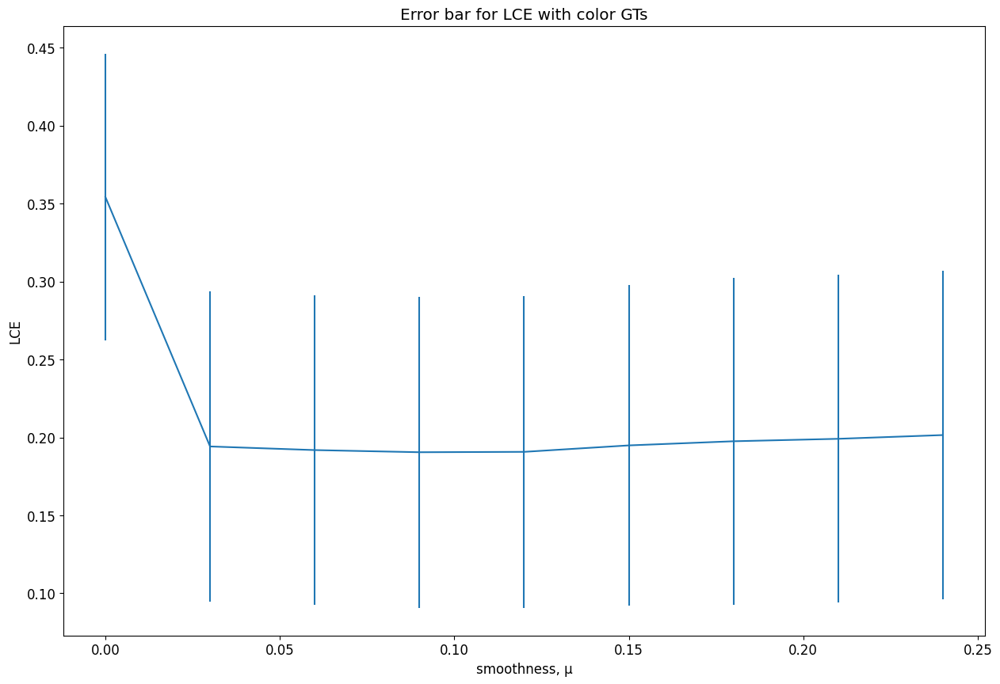

In [120]:
plt.figure(figsize=(15,10))
plt.errorbar(np.linspace(0,0.24,9),LCE_color_mean_sl_m,yerr=LCE_color_std_sl_m)
plt.xlabel('smoothness, μ')
plt.ylabel('LCE')
plt.title('Error bar for LCE with color GTs')
plt.show()

We choose  <b>μ = 0.12</b> as the “best” smoothness parameter for this dataset. This is because the error measures give the lowest value with <b>μ = 0.12</b> as shown in error bar plots.

We loop over all 100 test images in the BSDS, apply ACWE segmentation with <b>μ = 0.12</b>, and compute the GCE and LCE for each image, as compared to both the grayscale and color GTs. We display the performance of the ACWE algorithm as the average error plus/minus the standard deviation for <b>μ = 0.12</b>.

In [121]:
image_directory = 'BSDS300/images/test/'
color_directory='BSDS300/masks/color/test/'
gray_directory='BSDS300/masks/gray/test/'

image_filenames = sorted(glob.glob(image_directory+'*.jpg'))  
color_GT_filenames = sorted(glob.glob(color_directory+'*.png')) 
gray_GT_filenames = sorted(glob.glob(gray_directory+'*.png')) 

GCE_color_sl=[]
LCE_color_sl=[]
GCE_gray_sl=[]
LCE_gray_sl=[]

begin_time_slic=time.time()

for f,image_filename in enumerate(image_filenames):
    I_ii=imageio.imread(image_filename)
    I_gray=skimage.color.rgb2gray(I_ii)
    I_acwe,phi,energies=skimage.segmentation.chan_vese(I_gray,mu=0.12,tol\
    =1e-3,max_num_iter=500,init_level_set='checkerboard',extended_output=True)
    Seg=skimage.measure.label(I_acwe)
    
    I_color=imageio.imread(color_GT_filenames[f])
    [GCE_cl_sl,LCE_cl_sl]=compute_GCE_LCE(Seg,I_color)
    GCE_color_sl.append(GCE_cl_sl)
    LCE_color_sl.append(LCE_cl_sl)
    
    I_gr=imageio.imread(gray_GT_filenames[f])
    [GCE_gr_sl,LCE_gr_sl]=compute_GCE_LCE(Seg,I_gr)
    GCE_gray_sl.append(GCE_gr_sl)
    LCE_gray_sl.append(LCE_gr_sl)
    
    
total_time_slic= time.time() - begin_time_slic
GCE_color_mean_sl=sum(GCE_color_sl) / len(GCE_color_sl)
LCE_color_mean_sl=sum(LCE_color_sl) / len(LCE_color_sl)
GCE_color_std_sl=np.std(GCE_color_sl)
LCE_color_std_sl=np.std(LCE_color_sl)



GCE_gray_mean_sl=sum(GCE_gray_sl) / len(GCE_gray_sl)
LCE_gray_mean_sl=sum(LCE_gray_sl) / len(LCE_gray_sl)
GCE_gray_std_sl=np.std(GCE_gray_sl)
LCE_gray_std_sl=np.std(LCE_gray_sl)

print("Total time taken: ", total_time_slic, "s")
print("GCE for color GT: ", GCE_color_mean_sl, "\u00B1", GCE_color_std_sl)
print("LCE for color GT: ", LCE_color_mean_sl, "\u00B1", LCE_color_std_sl)
print("GCE for grayscale GT: ", GCE_gray_mean_sl, "\u00B1", GCE_gray_std_sl)
print("LCE for grayscale GT: ", LCE_gray_mean_sl, "\u00B1", LCE_gray_std_sl)

Total time taken:  470.2941358089447 s
GCE for color GT:  0.24157215308467947 ± 0.12709968391710627
LCE for color GT:  0.19828228538389148 ± 0.10892305484330854
GCE for grayscale GT:  0.25203675077103116 ± 0.12287810062821698
LCE for grayscale GT:  0.20839827050885998 ± 0.10713335555434077


Using μ = 0.12, we find that all GCE, and LCE values are decreased compared to GCE, and LCE values using μ = 0.01 for ACWE segmentation.

## Best and Worst ACWE Performance:
We will utilize GCE using color GTs to find the best and worse ACWE performance images. 

## Best ACWE Performance:
We find the best ACWE performance image using GCE for color GTs and display the original best performance image, and the best ACWE performance image with average color ACWE regions.

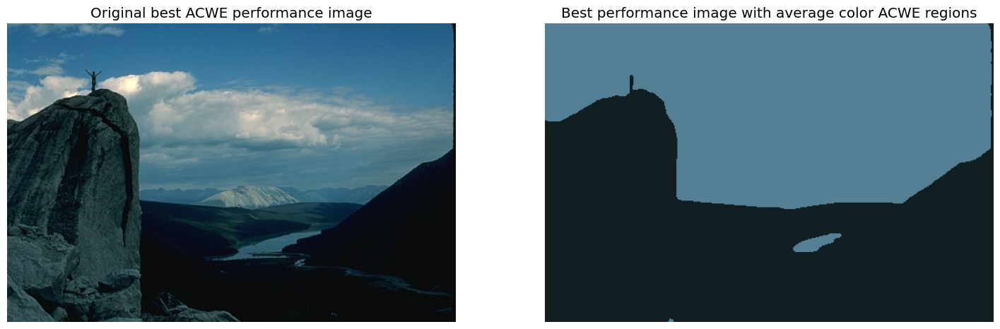

In [122]:
min_GCE_color_sl = min(GCE_color_sl)
min_GCE_color_index_sl=GCE_color_sl.index(min_GCE_color_sl)

I_ACWE_best=imageio.imread(image_filenames[min_GCE_color_index_sl])
I_gray=skimage.color.rgb2gray(I_ACWE_best)
I_acwe,phi,energies=skimage.segmentation.chan_vese(I_gray,mu=0.12,tol\
=1e-3,max_num_iter=500,init_level_set='checkerboard',extended_output=True)

Seg_b=skimage.measure.label(I_acwe)

I_avg_acw_best=Seg_avg_color(I_ACWE_best,Seg_b)

# Displaying the images
plt.figure(figsize=(18, 15))  
plt.subplot(1, 2, 1) 
plt.imshow(I_ACWE_best)
plt.axis('off')
plt.title('Original best ACWE performance image')


plt.subplot(1, 2, 2) 
plt.imshow(I_avg_acw_best)
plt.axis('off')
plt.title('Best performance image with average color ACWE regions')
plt.show()

In [123]:
print("The GCE for best ACWE performance image using color GT: ", GCE_color_sl[min_GCE_color_index_sl])
print("The LCE for best ACWE performance image using color GT: ", LCE_color_sl[min_GCE_color_index_sl])

print("The GCE for best ACWE performance image using grayscale GT: ", GCE_gray_sl[min_GCE_color_index_sl])
print("The LCE for best ACWE performance image using grayscale GT: ", LCE_gray_sl[min_GCE_color_index_sl])

The GCE for best ACWE performance image using color GT:  0.014357806535046102
The LCE for best ACWE performance image using color GT:  0.014357806535046102
The GCE for best ACWE performance image using grayscale GT:  0.014948469101426384
The LCE for best ACWE performance image using grayscale GT:  0.014948160793615554


ACWE segmentation works well in this image because this image contains contrast regions. As ACWE performs segmentation based on properties of the regions, it works quite well. We observe that by increasing μ value, we achieve more smoothness in the segmentation, but it eliminates some details. For example, the hand of the person is eliminated in the average color segmentation image. 

## Worse ACWE Performance:
We find the worse ACWE performance image using GCE for color GTs and display the original worse performance image, and the worse ACWE performance image with average color ACWE regions.

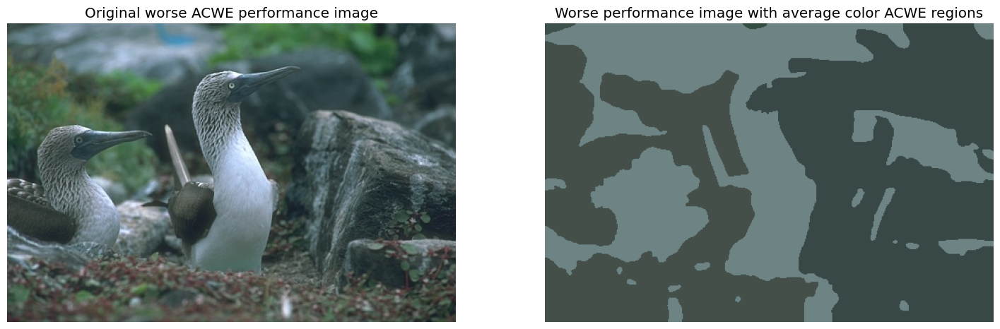

In [124]:
max_GCE_color_sl = max(GCE_color_sl)
max_GCE_color_index_sl=GCE_color_sl.index(max_GCE_color_sl)

I_ACWE_worse=imageio.imread(image_filenames[max_GCE_color_index_sl])
I_gray=skimage.color.rgb2gray(I_ACWE_worse)
I_acwe,phi,energies=skimage.segmentation.chan_vese(I_gray,mu=0.12,tol\
=1e-3,max_num_iter=500,init_level_set='checkerboard',extended_output=True)

Seg_w=skimage.measure.label(I_acwe)

I_avg_acw_worse=Seg_avg_color(I_ACWE_worse,Seg_w)

# Displaying the images
plt.figure(figsize=(18, 15))  
plt.subplot(1, 2, 1) 
plt.imshow(I_ACWE_worse)
plt.axis('off')
plt.title('Original worse ACWE performance image')


plt.subplot(1, 2, 2) 
plt.imshow(I_avg_acw_worse)
plt.axis('off')
plt.title('Worse performance image with average color ACWE regions')
plt.show()

In [125]:
print("The GCE for worse ACWE performance image using color GT: ", GCE_color_sl[max_GCE_color_index_sl])
print("The LCE for worse ACWE performance image using color GT: ", LCE_color_sl[max_GCE_color_index_sl])

print("The GCE for worse ACWE performance image using grayscale GT: ", GCE_gray_sl[max_GCE_color_index_sl])
print("The LCE for worse ACWE performance image using grayscale GT: ", LCE_gray_sl[max_GCE_color_index_sl])

The GCE for worse ACWE performance image using color GT:  0.5255386371608278
The LCE for worse ACWE performance image using color GT:  0.481063033632683
The GCE for worse ACWE performance image using grayscale GT:  0.47890701716346173
The LCE for worse ACWE performance image using grayscale GT:  0.4757527580494954


ACWE segmentation performs worse for this image. The background of the image has complicated structures. As a result, it is difficult for ACWE method to use the property of the regions to perform the segmentation properly.

## (g) Summary:
In this project, we learn about different types of image segmentation methods: Otsu threshold segmentation, SLIC superpixel segmentation, active contour (snakes) segmentation, and active contours without edges (ACWE) segmentation. Otsu threshold segmentation seperates image into foreground and background by maximizing inter-class variance. SLIC superpixel segmentation uses modified k-means clustering algorithm to produce superpixels based on their color similarity and proximity in the image plane. Active contour (snakes) segmentation uses energy forces and constraints to perform segmentation of the image into only two regions, foreground and background. Active contours without edges (ACWE) segmentation performs segmentation based on properties of the region. The segmentation algorithms are very sensitive to the different parameters of the algorithms. To achieve a better segmentation performance, a proper knowledge of parameters is required.

By analyzing the results of different segmentation algorithm, we can conclude that global consistency error (GCE) and local consistency error (LCE) are a realiable error measure for evaluating segmentation performance of a segmentation algorithm. GCE is more strict compared to LCE and GCE is always greater than or equal to LCE.

We get the smallest average GCE and LCE values with SLIC superpixel segmentation compared to other segmentation algorithms for BSDS dataset. The mean GCE and mean LCE values using color GTs are  greater than the mean GCE and mean LCE values using grayscale GTs for SLIC superpixel segmentation. The mean GCE and mean LCE values using color GTs are smaller than the mean GCE and mean LCE values using grayscale GTs for Otsu segmentation and ACWE Segmentation.

If we visualize the segmentation of the image, in my view, ACWE performs better segmentation. If we observe the best performance image with average color ACWE regions with smoothness μ = 0.01, we can visualize the shape of object quite well. On the other hand, for SLIC superpixel algorithm, the shape of object does not visualized properly for the same best performance image. If we consider multiple objects in a image, snake segmentation will provide worse segmentation performance. This is because snake segmentation can deal with only one contour and thus segmentation of the image into only two regions, foreground and background.

In my view, the biggest issue affecting the segmentation performance is the choices of parameters for any segmentation algorithm. By considering the structure, contrastness, texture of the image, proper parameters need to be selected which is very challenging. To solve this issue, I would consider using optimal parameter values (like we find optimal compactness for SLIC superpixel segmentation) for a dataset while appying a segmentation algorithm. 